In [1]:
# Using Jack's code to get cleaned and scored data

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.api as sm

In [3]:
crime_data = pd.read_csv('Crime_Data_from_2020_to_Present.csv')

print(crime_data.head())
print(crime_data.info())
print(crime_data.isnull().sum())

severity_data = pd.read_csv('Crime_description_severity_value.csv')
employment_data = pd.read_csv('Labor_Statistics.csv')
police_funding_data = pd.read_csv('Police_funding.csv')
weapon_severity_data = pd.read_csv('Weapon_description_severity_value.csv')

# severity data inclusion to main dataset
merged_data = pd.merge(crime_data, severity_data, left_on="Crm Cd Desc", right_on="Crime", how="left")
merged_data = pd.merge(merged_data, weapon_severity_data, left_on="Weapon Desc", right_on="Weapons", how="left")
merged_data['Index Effect'] = merged_data['Index Effect'].fillna(0)

merged_data.head()

       DR_NO               Date Rptd                DATE OCC  TIME OCC  AREA  \
0   10304468  01/08/2020 12:00:00 AM  01/08/2020 12:00:00 AM      2230     3   
1  190101086  01/02/2020 12:00:00 AM  01/01/2020 12:00:00 AM       330     1   
2  200110444  04/14/2020 12:00:00 AM  02/13/2020 12:00:00 AM      1200     1   
3  191501505  01/01/2020 12:00:00 AM  01/01/2020 12:00:00 AM      1730    15   
4  191921269  01/01/2020 12:00:00 AM  01/01/2020 12:00:00 AM       415    19   

     AREA NAME  Rpt Dist No  Part 1-2  Crm Cd  \
0    Southwest          377         2     624   
1      Central          163         2     624   
2      Central          155         2     845   
3  N Hollywood         1543         2     745   
4      Mission         1998         2     740   

                                         Crm Cd Desc  ... Status  \
0                           BATTERY - SIMPLE ASSAULT  ...     AO   
1                           BATTERY - SIMPLE ASSAULT  ...     IC   
2          SEX OFFEN

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Part 1-2,Crm Cd,Crm Cd Desc,...,LOCATION,Cross Street,LAT,LON,Crime,Severity,Value,Weapons,Weapon Severity,Index Effect
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,2,624,BATTERY - SIMPLE ASSAULT,...,1100 W 39TH PL,NaN,34.0141,-118.2978,BATTERY - SIMPLE ASSAULT,Low,35,"STRONG-ARM (HANDS, FIST, FEET OR BODILY FORCE)",Low,1.0
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,2,624,BATTERY - SIMPLE ASSAULT,...,700 S HILL ST,NaN,34.0459,-118.2545,BATTERY - SIMPLE ASSAULT,Low,35,UNKNOWN WEAPON/OTHER WEAPON,Medium,2.0
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,2,845,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,...,200 E 6TH ST,NaN,34.0448,-118.2474,SEX OFFENDER REGISTRANT OUT OF COMPLIANCE,Medium,50,NaN,NaN,0.0
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,2,745,VANDALISM - MISDEAMEANOR ($399 OR UNDER),...,5400 CORTEEN PL,NaN,34.1685,-118.4019,VANDALISM - MISDEAMEANOR ($399 OR UNDER),Low,20,NaN,NaN,0.0
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,2,740,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",...,14400 TITUS ST,NaN,34.2198,-118.4468,"VANDALISM - FELONY ($400 & OVER, ALL CHURCH VA...",Low,25,NaN,NaN,0.0


In [4]:
merged_data['victim_age_index'] = merged_data['Vict Age'].apply(lambda age: 10 if (age >= 0 and age < 18) or age >= 65 else 0)

merged_data['Index Effect'] = merged_data['Index Effect'].fillna(0).astype(float)

merged_data['Overall_Severity'] = merged_data['Value'] + (merged_data['Index Effect'] * 5) + merged_data['victim_age_index']

print(merged_data[['Value', 'Index Effect', 'victim_age_index', 'Overall_Severity']].head())

   Value  Index Effect  victim_age_index  Overall_Severity
0     35           1.0                 0              40.0
1     35           2.0                 0              45.0
2     50           0.0                10              60.0
3     20           0.0                10              30.0
4     25           0.0                 0              25.0


In [5]:
required_columns = [
    'DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA', 'AREA NAME', 'Rpt Dist No',
    'Status', 'Status Desc', 'LOCATION', 'Cross Street', 'LAT', 'LON', 'Overall_Severity'
]

# clean dataset
cleaned_data = merged_data[required_columns]

cleaned_data.head()

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA,AREA NAME,Rpt Dist No,Status,Status Desc,LOCATION,Cross Street,LAT,LON,Overall_Severity
0,10304468,01/08/2020 12:00:00 AM,01/08/2020 12:00:00 AM,2230,3,Southwest,377,AO,Adult Other,1100 W 39TH PL,NaN,34.0141,-118.2978,40.0
1,190101086,01/02/2020 12:00:00 AM,01/01/2020 12:00:00 AM,330,1,Central,163,IC,Invest Cont,700 S HILL ST,NaN,34.0459,-118.2545,45.0
2,200110444,04/14/2020 12:00:00 AM,02/13/2020 12:00:00 AM,1200,1,Central,155,AA,Adult Arrest,200 E 6TH ST,NaN,34.0448,-118.2474,60.0
3,191501505,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,1730,15,N Hollywood,1543,IC,Invest Cont,5400 CORTEEN PL,NaN,34.1685,-118.4019,30.0
4,191921269,01/01/2020 12:00:00 AM,01/01/2020 12:00:00 AM,415,19,Mission,1998,IC,Invest Cont,14400 TITUS ST,NaN,34.2198,-118.4468,25.0


In [6]:
cleaned_data['DATE OCC'] = pd.to_datetime(cleaned_data['DATE OCC'])

<ipython-input-6-39cfcc706d04>:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  cleaned_data['DATE OCC'] = pd.to_datetime(cleaned_data['DATE OCC'])
<ipython-input-6-39cfcc706d04>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cleaned_data['DATE OCC'] = pd.to_datetime(cleaned_data['DATE OCC'])


In [7]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

# Assuming crime_data_scored is loaded as a DataFrame from the uploaded file
# Example structure of crime_data_scored will be inferred from here
# Grouping by date and region and summing severity scores

# Example DataFrame structure
# crime_data_scored = pd.read_csv("crime_data_scored.csv")  # Uncomment when integrating

def clean_and_prepare_data(crime_data_scored):
    # Convert 'DATE OCC' to datetime and sort
    crime_data_scored['DATE OCC'] = pd.to_datetime(crime_data_scored['DATE OCC'])
    crime_data_scored.sort_values(['DATE OCC', 'AREA NAME'], inplace=True)

    # Aggregate by date and region
    grouped_data = crime_data_scored.groupby(['DATE OCC', 'AREA NAME']).agg({'Overall_Severity': 'sum'}).reset_index()
    grouped_data.rename(columns={'Overall_Severity': 'Daily Score'}, inplace=True)

    # Pivot data to have regions as columns
    pivoted_data = grouped_data.pivot(index='DATE OCC', columns='AREA NAME', values='Daily Score').fillna(0)

    return pivoted_data

# Generate input-output sequences
def generate_sequences(data, sequence_length=30):
    X, y = [], []
    regions = data.columns
    for i in range(len(data) - sequence_length):
        X.append(data.iloc[i:i+sequence_length].values)  # 30 days
        y.append(data.iloc[i+sequence_length].values)  # 31st day
    return np.array(X), np.array(y), regions

# Train-test split
def split_data(X, y, test_size=0.2):
    return train_test_split(X, y, test_size=test_size, random_state=42)

In [8]:
pivoted_data = clean_and_prepare_data(cleaned_data)
X, y, regions = generate_sequences(pivoted_data)
X_train, X_test, y_train, y_test = split_data(X, y)

<ipython-input-7-791bd837f482>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data_scored['DATE OCC'] = pd.to_datetime(crime_data_scored['DATE OCC'])
<ipython-input-7-791bd837f482>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  crime_data_scored.sort_values(['DATE OCC', 'AREA NAME'], inplace=True)


In [9]:
pivoted_data

AREA NAME,77th Street,Central,Devonshire,Foothill,Harbor,Hollenbeck,Hollywood,Mission,N Hollywood,Newton,...,Olympic,Pacific,Rampart,Southeast,Southwest,Topanga,Van Nuys,West LA,West Valley,Wilshire
DATE OCC,,,,,,,,,,,,,,,,,,,,,
2020-01-01,4915.0,2750.0,2950.0,2480.0,2475.0,2360.0,3275.0,3235.0,3010.0,3505.0,...,2450.0,2205.0,3495.0,3940.0,2405.0,2860.0,2045.0,1745.0,1855.0,1880.0
2020-01-02,1950.0,1880.0,1185.0,930.0,1645.0,840.0,1230.0,1185.0,1305.0,1240.0,...,1185.0,1225.0,1310.0,1570.0,1410.0,615.0,1550.0,1100.0,1215.0,1115.0
2020-01-03,3200.0,2020.0,970.0,1605.0,1345.0,1510.0,1085.0,1275.0,1755.0,970.0,...,1120.0,1465.0,1200.0,1375.0,1305.0,1235.0,1230.0,1265.0,1945.0,1455.0
2020-01-04,2305.0,1865.0,1145.0,1095.0,1035.0,1190.0,1290.0,1075.0,935.0,1885.0,...,1065.0,1700.0,1035.0,1545.0,2000.0,1295.0,1060.0,1050.0,750.0,1220.0
2020-01-05,2905.0,1380.0,1205.0,755.0,1540.0,1575.0,1105.0,925.0,1510.0,1320.0,...,1005.0,1150.0,1125.0,1505.0,1465.0,1090.0,1335.0,970.0,750.0,850.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-29,1810.0,1735.0,650.0,910.0,1220.0,1095.0,1250.0,955.0,1305.0,1995.0,...,1110.0,1390.0,1810.0,1810.0,1680.0,930.0,1600.0,625.0,515.0,1330.0
2023-06-30,1435.0,1970.0,1240.0,1390.0,1840.0,1140.0,1485.0,1045.0,745.0,2175.0,...,1425.0,1135.0,1485.0,1660.0,1100.0,895.0,650.0,695.0,1155.0,935.0
2023-07-01,1840.0,2780.0,745.0,1075.0,1475.0,865.0,1075.0,1245.0,1050.0,2245.0,...,1660.0,980.0,1940.0,2225.0,780.0,1095.0,700.0,1190.0,1425.0,1255.0


In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, Flatten, Dense, Dropout

# Define the CNN model
def build_cnn_model(input_shape, output_units):
    model = Sequential([
        Conv1D(filters=64, kernel_size=3, activation='relu', input_shape=input_shape),
        Dropout(0.2),
        Conv1D(filters=32, kernel_size=3, activation='relu'),
        Dropout(0.2),
        Flatten(),
        Dense(128, activation='relu'),
        Dense(output_units, activation='linear')  # Output layer
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Example usage (replace with actual training data when available)
# input_shape = (30, 21)  # 30 days of scores for 21 regions
# output_units = 21  # Predicting scores for 21 regions

model = build_cnn_model(input_shape=(30, 21), output_units=21)

# Train the model (replace with actual training data)
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=200,
    batch_size=32
)

# Save the model for future use
model.save('crime_score_cnn_model.h5')

# Evaluate the model (replace with actual testing data)
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 881640.4375 - mae: 684.3698 - val_loss: 218538.6875 - val_mae: 352.8619
Epoch 2/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 226385.8125 - mae: 363.6640 - val_loss: 207673.1875 - val_mae: 343.5907
Epoch 3/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 227843.7188 - mae: 341.4291 - val_loss: 227072.1875 - val_mae: 361.1399
Epoch 4/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 223288.3281 - mae: 333.8096 - val_loss: 184761.6875 - val_mae: 323.2769
Epoch 5/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 193288.0938 - mae: 326.0723 - val_loss: 165454.0625 - val_mae: 307.2512
Epoch 6/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - loss: 208478.5469 - mae: 327.3558 - val_loss: 208222.6875 - val_mae: 344.8962
Epoch 7/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 190336.7500 - mae: 330.4838 - val_loss: 176700.4844 - val_mae: 316.2838
Epoch 8/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step - loss: 193193.8438 - ma

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 248149.1250 - mae: 381.1245 
Test Loss: 239526.6875, Test MAE: 375.5612487792969


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
Sample 1:
Actual:     [2315. 2440. 1440. 1440. 1330. 1690. 1845. 1275. 1155. 1285. 1345. 1805.
 1830. 1660. 1970. 1865. 1415. 1450.  740. 1825. 1120.]
Predicted:  [1614.9312  1978.589   1208.4816  1011.1509  1103.5424   865.20404
 1546.0707   994.92865 1320.2335  1756.4265  1297.1226  1392.5123
 1450.0374  1639.5681  1819.3734  1937.0615  1335.2208   996.58075
 1226.0452  1416.4229  1388.9298 ]


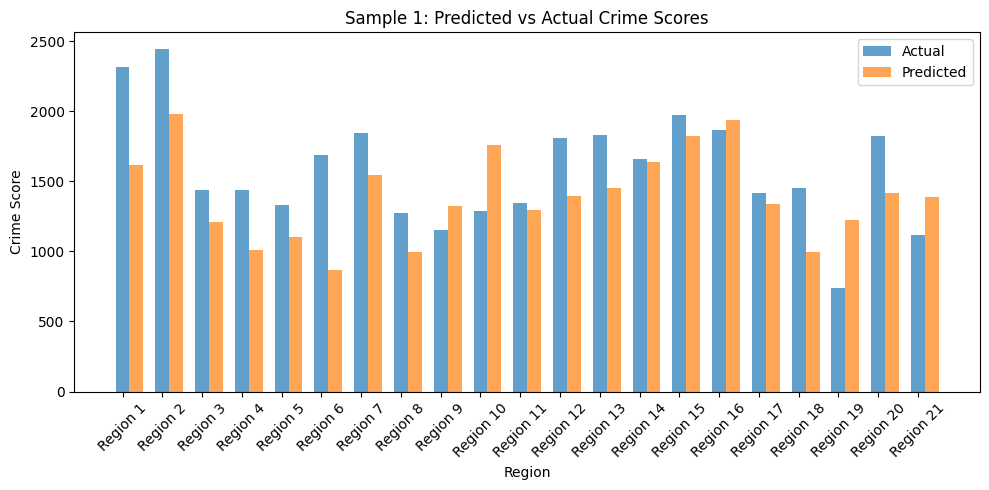

Sample 2:
Actual:     [2595. 1595. 1210.  980. 1925. 1485.  850. 1255. 1315. 2390. 1625. 1590.
 1325.  820. 1890. 1360.  570. 1390. 1705. 1405. 1305.]
Predicted:  [1760.6359  1355.7754   882.00977  815.7614  1369.0419  1033.9755
 1445.1528   807.0022  1308.7637  1273.7356   786.2834  1185.2097
 1440.7844  1092.2233  1526.3881  1395.0525   908.7633  1045.4259
 1138.4722   741.6014  1123.7333 ]


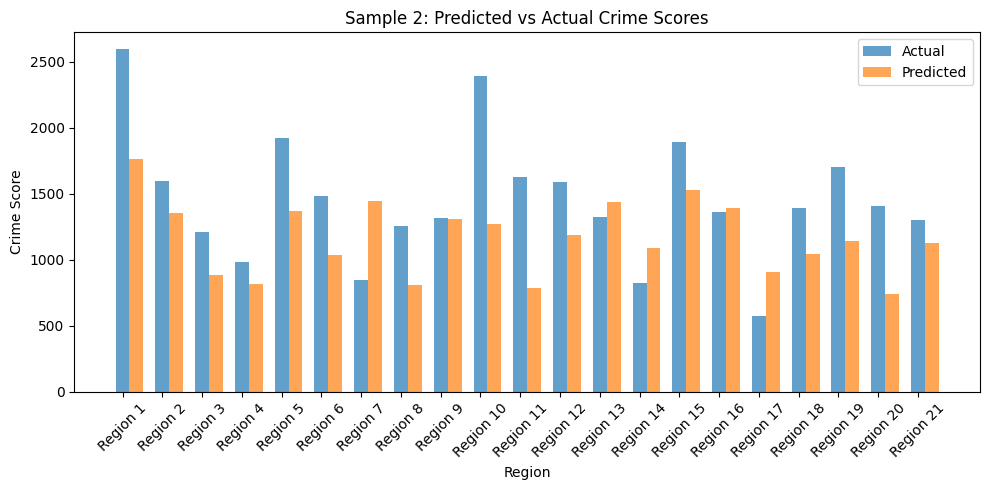

Sample 3:
Actual:     [2515.  985. 1565.  905. 1720.  800. 1380. 1130. 1225. 1515. 1040.  935.
 1580. 1095. 2190. 2145. 1445. 1625. 1055. 1245. 1410.]
Predicted:  [1654.8868   908.9089   779.41925  884.6667  1162.5706   949.2752
 1058.6813   905.30927 1152.2389  1211.5941   974.7979  1131.4156
 1124.4828   890.1493  1087.5701  1332.6393   854.99023 1112.4022
  921.8128   840.8302   900.46375]


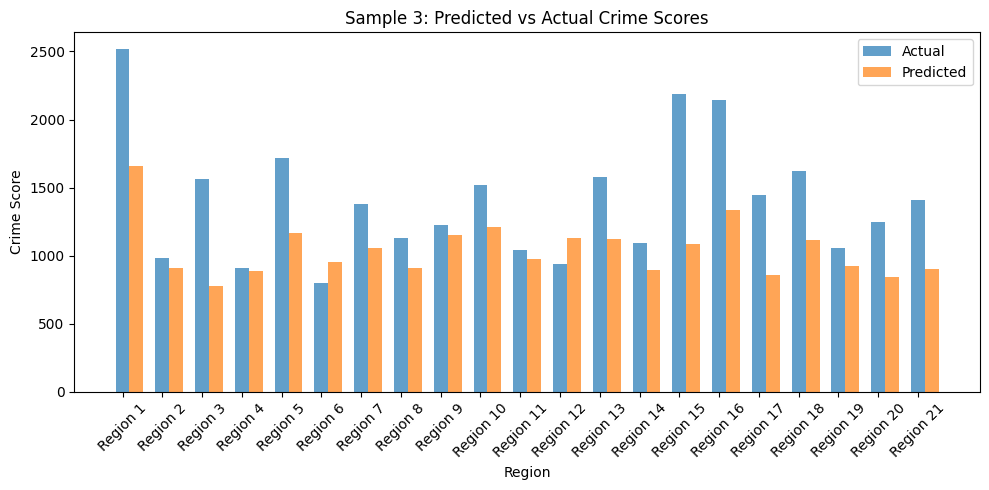

Sample 4:
Actual:     [2300. 2150.  805.  640. 1700.  725. 1670. 1380. 1630. 3265. 1210. 1570.
 2410.  930. 2815. 1225. 1710.  760. 1265. 1395.  965.]
Predicted:  [1944.0515  1431.7006  1029.1162  1083.2736  1196.8854  1170.2484
 1645.6552   933.70026 1391.3171  1398.5728  1202.7627  1324.3357
 1520.7246  1040.6549  1104.6143  1394.0936  1137.7975  1237.5311
 1080.5371  1079.3923   953.711  ]


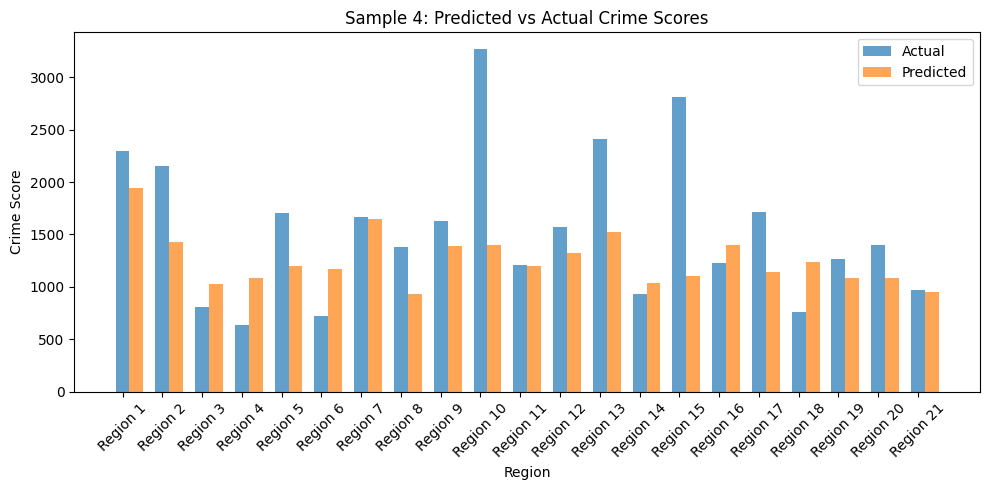

Sample 5:
Actual:     [1580. 1405.  755.  775. 1140. 1570. 1735.  680. 1475. 1770. 1490. 1900.
 1550. 1530. 1815. 1755.  815. 1115. 1480.  925. 1020.]
Predicted:  [1524.9058  1406.0916   931.3449   773.3076  1204.5679   885.7293
 1555.0281  1125.2349  1162.7518  1305.2362   864.03674 1091.8597
 1561.2404   928.003   1265.7777  1157.6403   903.2387   944.6095
  810.5131   841.997    897.10693]


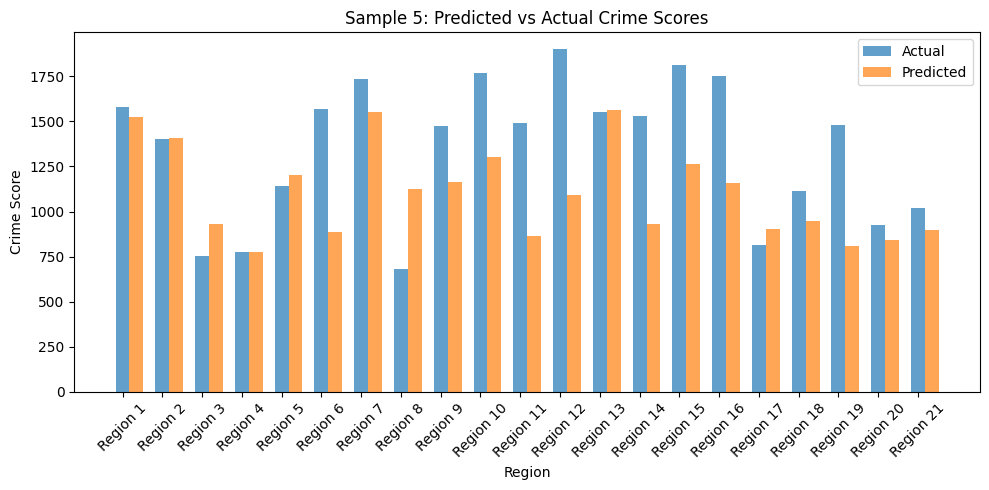

In [11]:
import numpy as np
import matplotlib.pyplot as plt

# Make predictions on the test set
y_pred = model.predict(X_test)

# Choose random samples to display
num_samples = 5  # Number of samples to display
sample_indices = np.random.choice(len(X_test), num_samples, replace=False)

# Display predictions vs actual
for i, idx in enumerate(sample_indices):
    actual = y_test[idx]
    predicted = y_pred[idx]

    print(f"Sample {i+1}:")
    print("Actual:    ", actual)
    print("Predicted: ", predicted)

    # Bar chart for comparison
    plt.figure(figsize=(10, 5))
    bar_width = 0.35
    indices = np.arange(len(actual))

    plt.bar(indices, actual, bar_width, label='Actual', alpha=0.7)
    plt.bar(indices + bar_width, predicted, bar_width, label='Predicted', alpha=0.7)

    plt.xlabel('Region')
    plt.ylabel('Crime Score')
    plt.title(f'Sample {i+1}: Predicted vs Actual Crime Scores')
    plt.legend()
    plt.xticks(indices, [f'Region {j+1}' for j in range(len(actual))], rotation=45)
    plt.tight_layout()
    plt.show()


# Trying to improve the model by changing architecture

In [12]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, BatchNormalization, GlobalAveragePooling1D, Dense, Dropout

# Define the enhanced CNN model
# def build_enhanced_cnn_model(input_shape, output_units):
#     model = Sequential([
#         Conv1D(filters=128, kernel_size=3, activation='relu', input_shape=input_shape),
#         BatchNormalization(),
#         Dropout(0.3),
#         Conv1D(filters=64, kernel_size=3, activation='relu'),
#         BatchNormalization(),
#         Dropout(0.3),
#         Conv1D(filters=32, kernel_size=3, activation='relu'),
#         BatchNormalization(),
#         Dropout(0.3),
#         GlobalAveragePooling1D(),
#         Dense(256, activation='relu'),
#         Dropout(0.4),
#         Dense(128, activation='relu'),
#         Dropout(0.4),
#         Dense(output_units, activation='linear')  # Output layer
#     ])
#     model.compile(optimizer='adam', loss='mse', metrics=['mae'])
#     return model

def build_enhanced_cnn_model(input_shape, output_units):
    model = Sequential([
        Conv1D(filters=256, kernel_size=3, activation='relu', input_shape=input_shape),
        BatchNormalization(),
        Dropout(0.2),
        Conv1D(filters=128, kernel_size=3, activation='relu'),
        BatchNormalization(),
        Dropout(0.2),
        Conv1D(filters=64, kernel_size=3, activation='relu'),
        BatchNormalization(),
        Dropout(0.2),
        GlobalAveragePooling1D(),
        Dense(512, activation='relu'),
        Dropout(0.3),
        Dense(256, activation='relu'),
        Dropout(0.3),
        Dense(output_units, activation='linear')  # Output layer
    ])
    model.compile(optimizer='adam', loss='mse', metrics=['mae'])
    return model

# Example usage
input_shape = (30, 21)  # 30 days of scores for 21 regions
output_units = 21  # Predicting scores for 21 regions

model = build_enhanced_cnn_model(input_shape=input_shape, output_units=output_units)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=200,  # Reduce epochs initially to monitor performance
    batch_size=32
)

# Save the model for future use
model.save('enhanced_crime_score_cnn_model.h5')

# Evaluate the model
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")


Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step - loss: 2503995.0000 - mae: 1499.5258 - val_loss: 2128019.0000 - val_mae: 1376.4253
Epoch 2/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 1772515.1250 - mae: 1178.6177 - val_loss: 1719879.8750 - val_mae: 1201.5265
Epoch 3/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 47ms/step - loss: 374021.8750 - mae: 461.8073 - val_loss: 1750380.3750 - val_mae: 1236.6713
Epoch 4/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 265462.6562 - mae: 381.4722 - val_loss: 1064100.3750 - val_mae: 893.0604
Epoch 5/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - loss: 260693.7812 - mae: 386.2346 - val_loss: 1049330.3750 - val_mae: 853.3327
Epoch 6/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 273634.6562 - mae: 387.6375 - val_loss: 219858.1406 - val_mae: 351.0073
Epoch 7/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 317835.1875 - mae: 408.0023 - val_loss: 696500.2500 - val_mae: 650.4697
Epoch 8/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 38ms/step - loss: 271191.9688 - ma

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 155175.8281 - mae: 303.9567
Test Loss: 152219.15625, Test MAE: 305.1341552734375


8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step


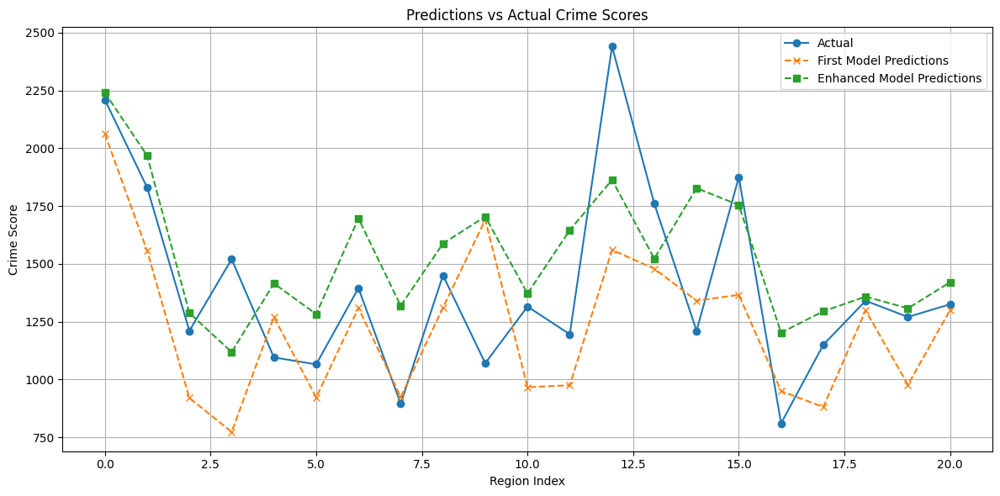

In [13]:
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model

# Load the saved models
model = load_model('crime_score_cnn_model.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})
enhanced_model = load_model('enhanced_crime_score_cnn_model.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})


# Generate predictions for the test set
y_pred_model = model.predict(X_test)
y_pred_enhanced_model = enhanced_model.predict(X_test)

# Select a sample to visualize
sample_idx = np.random.randint(0, len(X_test))  # Random test sample
actual_values = y_test[sample_idx]
predicted_values_model = y_pred_model[sample_idx]
predicted_values_enhanced_model = y_pred_enhanced_model[sample_idx]

# Plot the predictions vs actual
plt.figure(figsize=(12, 6))
indices = np.arange(len(actual_values))

plt.plot(indices, actual_values, label='Actual', marker='o')
plt.plot(indices, predicted_values_model, label='First Model Predictions', linestyle='--', marker='x')
plt.plot(indices, predicted_values_enhanced_model, label='Enhanced Model Predictions', linestyle='--', marker='s')

plt.xlabel('Region Index')
plt.ylabel('Crime Score')
plt.title('Predictions vs Actual Crime Scores')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [14]:
pivoted_data.loc['2023-06-01':'2023-06-30']
# df.loc['2023-01-01':'2023-01-02']

AREA NAME,77th Street,Central,Devonshire,Foothill,Harbor,Hollenbeck,Hollywood,Mission,N Hollywood,Newton,...,Olympic,Pacific,Rampart,Southeast,Southwest,Topanga,Van Nuys,West LA,West Valley,Wilshire
DATE OCC,,,,,,,,,,,,,,,,,,,,,
2023-06-01,1700.0,2415.0,1450.0,1355.0,1880.0,1030.0,1815.0,1210.0,1320.0,1695.0,...,1245.0,1635.0,1980.0,1205.0,2055.0,1265.0,2150.0,2040.0,1405.0,1715.0
2023-06-02,2035.0,2230.0,1740.0,1205.0,1000.0,1945.0,1395.0,1405.0,1455.0,1630.0,...,1420.0,1970.0,1875.0,2460.0,2135.0,730.0,1675.0,1245.0,1235.0,1745.0
2023-06-03,1690.0,2840.0,1415.0,1165.0,1020.0,1175.0,1940.0,1325.0,1130.0,2030.0,...,835.0,1840.0,1515.0,1935.0,1465.0,725.0,1050.0,1360.0,1575.0,2075.0
2023-06-04,2065.0,2595.0,1290.0,955.0,1190.0,880.0,1740.0,935.0,1600.0,1460.0,...,1295.0,1705.0,855.0,2000.0,1385.0,1005.0,1465.0,1390.0,1075.0,430.0
2023-06-05,2925.0,2260.0,1070.0,1115.0,610.0,915.0,1480.0,1115.0,1305.0,1695.0,...,2425.0,1070.0,1640.0,1700.0,1965.0,1260.0,1245.0,1210.0,1280.0,2005.0
2023-06-06,2175.0,2755.0,1275.0,1225.0,1545.0,730.0,1125.0,735.0,1685.0,1400.0,...,1590.0,2095.0,1275.0,1605.0,1845.0,1335.0,1855.0,975.0,1485.0,1125.0
2023-06-07,1865.0,2435.0,1105.0,580.0,1680.0,1475.0,1295.0,930.0,1350.0,1275.0,...,1680.0,2600.0,1020.0,2235.0,1055.0,965.0,1170.0,865.0,720.0,1870.0
2023-06-08,1940.0,2975.0,1460.0,745.0,1710.0,1420.0,810.0,1430.0,1300.0,1520.0,...,1515.0,1960.0,1690.0,1550.0,1110.0,1050.0,1350.0,1465.0,1155.0,1785.0
2023-06-09,2500.0,2340.0,1440.0,755.0,2180.0,1180.0,900.0,955.0,1540.0,1580.0,...,1755.0,1590.0,1535.0,1380.0,1900.0,1430.0,1645.0,1885.0,1990.0,1815.0


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━

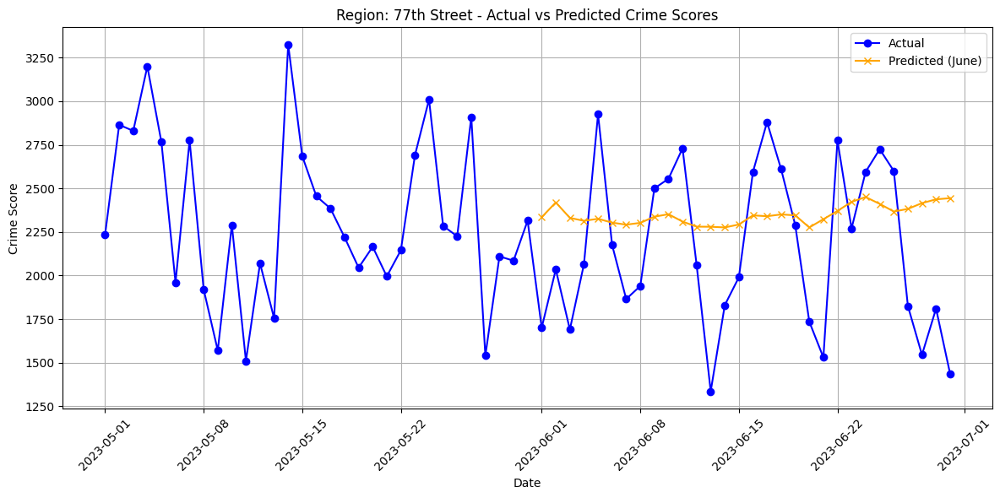

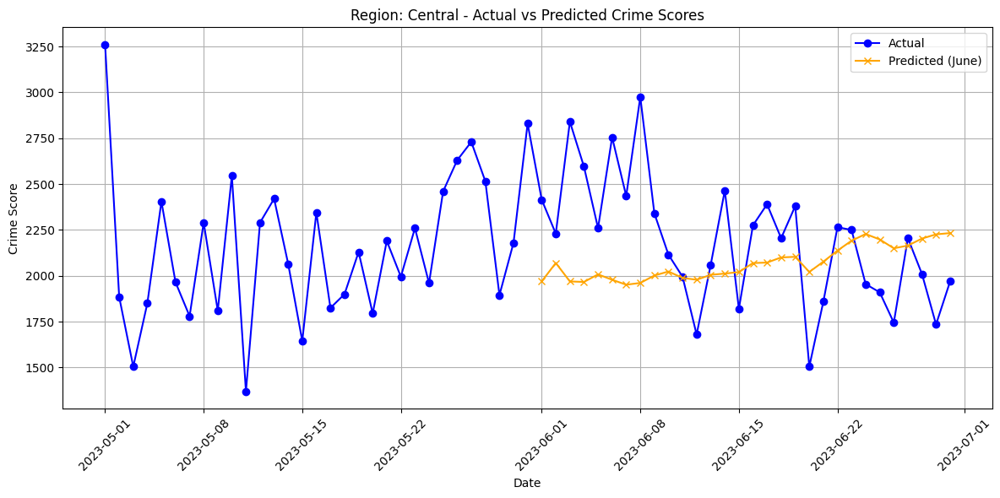

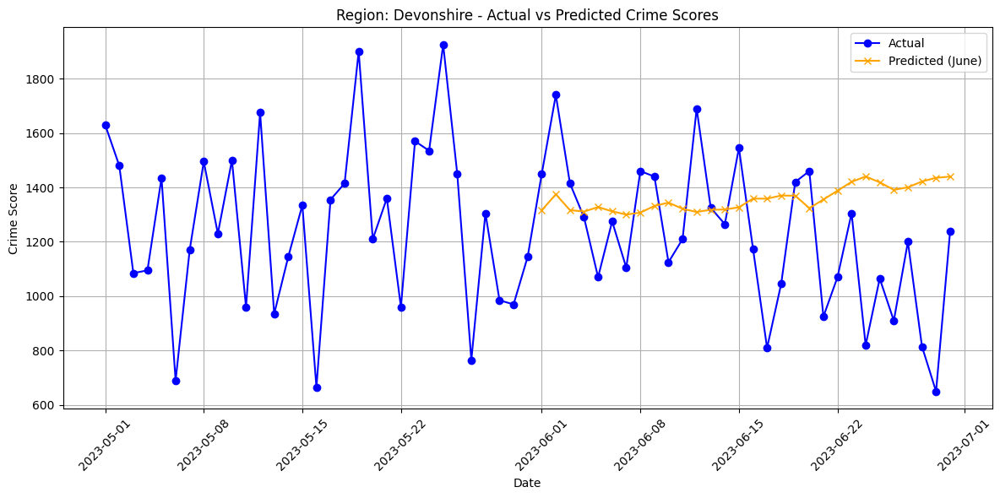

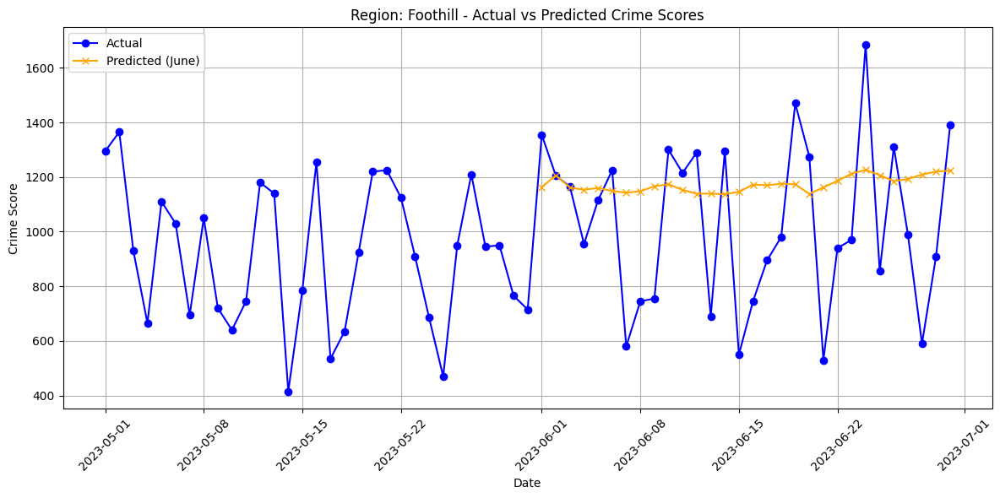

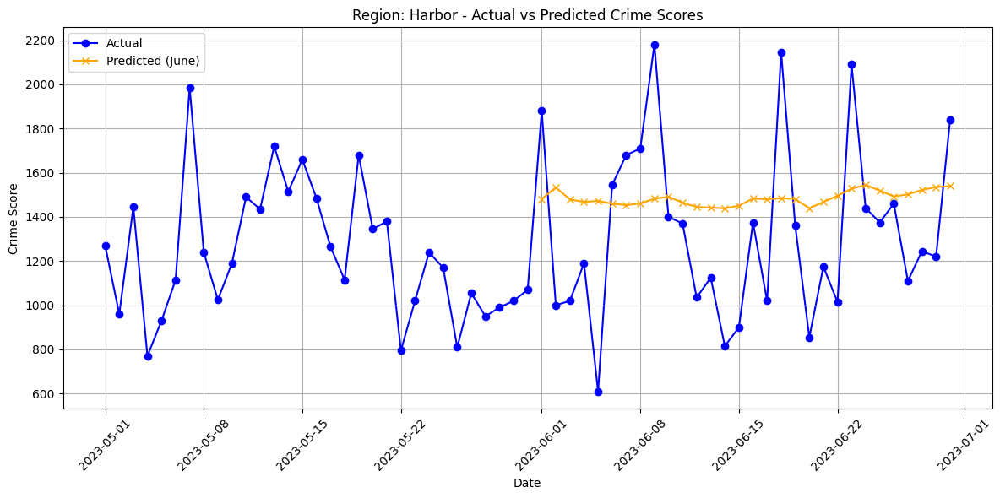

...

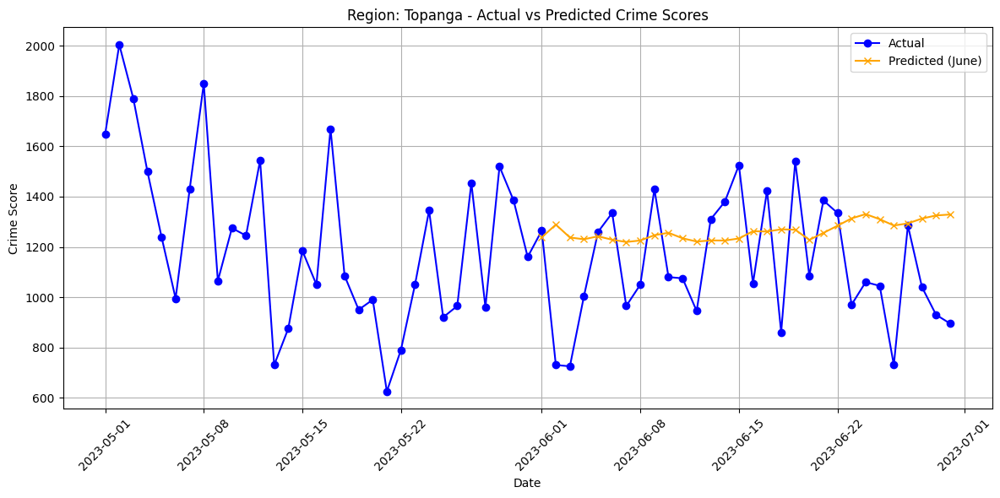

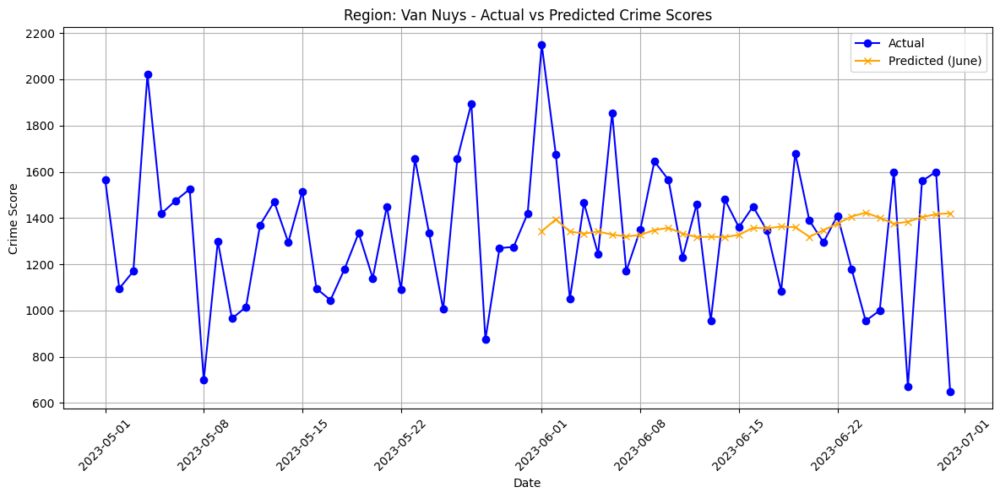

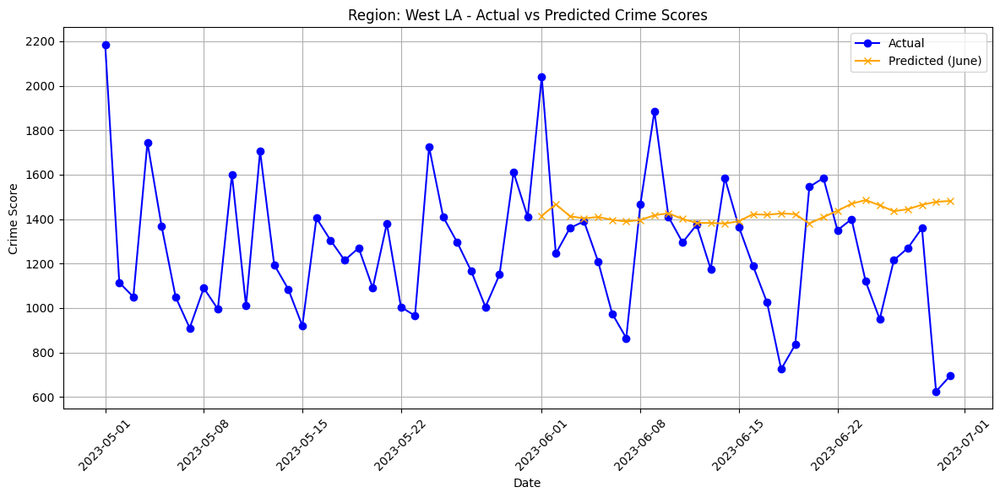

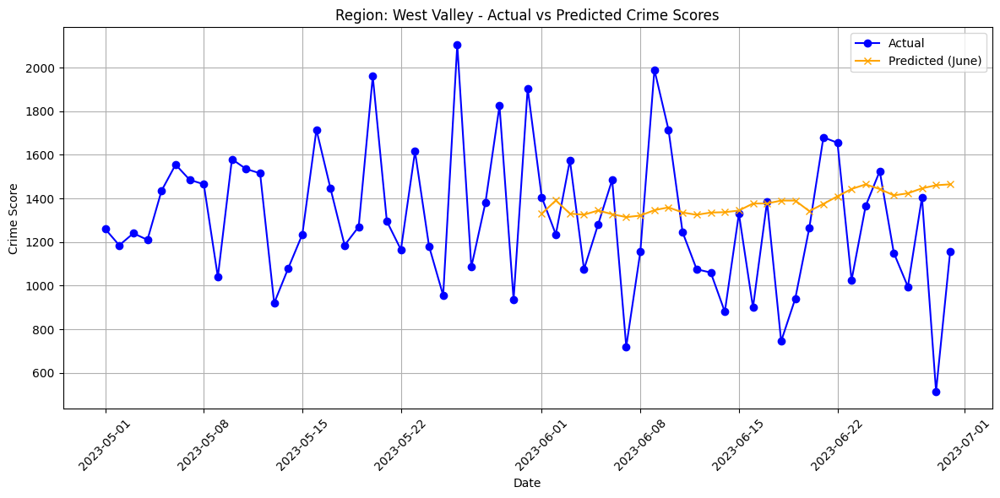

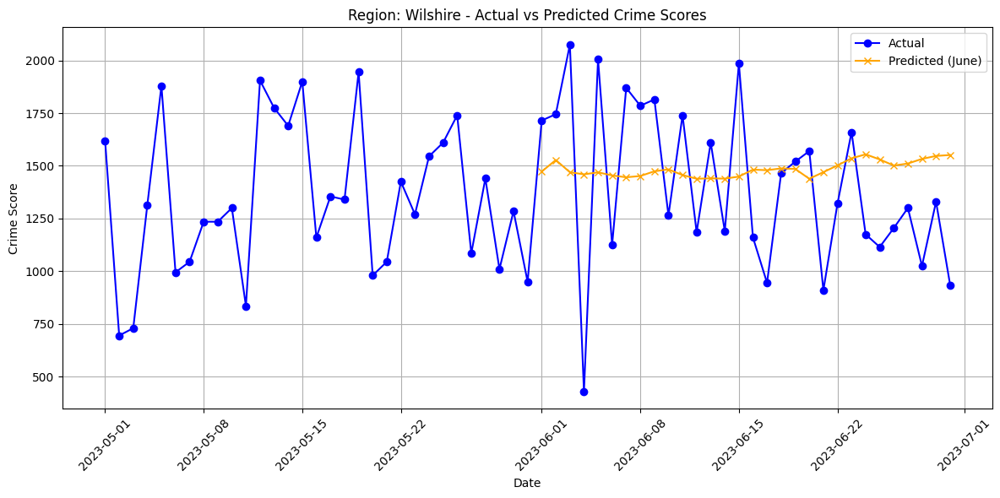

In [15]:
# Assuming pivoted_data, enhanced_model, and all dependencies are loaded and available

# Filter pivoted_data for May and June 2023
may_data = pivoted_data['2023-05-01':'2023-05-31']
june_data = pivoted_data['2023-06-01':'2023-06-30']

# Initialize a DataFrame to store predictions
june_predictions = pd.DataFrame(index=june_data.index, columns=pivoted_data.columns)

# Loop to predict each day in June
input_sequence = may_data.iloc[-30:].values  # Start with the last 30 days of May
for date in june_data.index:
    # Predict scores for the current date
    prediction = enhanced_model.predict(input_sequence[np.newaxis, :, :])[0]
    june_predictions.loc[date] = prediction

    # Update the input sequence by shifting and adding the current prediction
    input_sequence = np.vstack([input_sequence[1:], prediction])

# Plot results
for region in pivoted_data.columns:
    plt.figure(figsize=(12, 6))

    # Plot actual scores for May and June
    plt.plot(pivoted_data['2023-05-01':'2023-06-30'].index,
             pivoted_data['2023-05-01':'2023-06-30'][region],
             label='Actual', color='blue', marker='o')

    # Plot predicted scores for June
    plt.plot(june_predictions.index, june_predictions[region],
             label='Predicted (June)', color='orange', marker='x')

    # Titles and labels
    plt.title(f'Region: {region} - Actual vs Predicted Crime Scores')
    plt.xlabel('Date')
    plt.ylabel('Crime Score')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# REALLY BAD, TRYING TO INCORPORATE DAY OF WEEK NOW

In [16]:
# Add a day-of-week column
pivoted_data['DayOfWeek'] = pivoted_data.index.dayofweek

# Expand input dimensions to include the DayOfWeek feature
# Assuming pivoted_data has 21 columns for regions + DayOfWeek
input_columns = list(pivoted_data.columns)
input_columns.remove('DayOfWeek')  # Retain original region columns

# Reconstruct input data
X_with_day = np.array([
    np.hstack([pivoted_data.iloc[i:i+30][input_columns].values,
               pivoted_data.iloc[i:i+30][['DayOfWeek']].values])
    for i in range(len(pivoted_data) - 30)
])
y = pivoted_data.iloc[30:, :21].values  # Target remains the 21 region scores


In [17]:
# Generate new input-output sequences with DayOfWeek included
def generate_sequences_with_dayofweek(data, sequence_length=30):
    X, y = [], []
    regions = data.columns[:-1]  # Exclude DayOfWeek for target (y)

    for i in range(len(data) - sequence_length):
        # Include all columns (21 regions + DayOfWeek) for input (X)
        sequence = data.iloc[i:i + sequence_length].values
        target = data.iloc[i + sequence_length][regions].values  # 21 region scores for target
        X.append(sequence)
        y.append(target)

    return np.array(X), np.array(y), regions

# Generate new sequences with updated data
sequence_length = 30  # Number of days in the sequence
X, y, regions = generate_sequences_with_dayofweek(pivoted_data)

# Train-test split
X_train, X_test, y_train, y_test = split_data(X, y, test_size=0.2)

# Display the shapes of the generated datasets
X_train.shape, X_test.shape, y_train.shape, y_test.shape


((1000, 30, 22), (250, 30, 22), (1000, 21), (250, 21))

In [18]:
# Example usage
input_shape = (30, 22)  # 30 days of scores for 21 regions
output_units = 21  # Predicting scores for 21 regions

model = build_enhanced_cnn_model(input_shape=input_shape, output_units=output_units)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=200,  # Reduce epochs initially to monitor performance
    batch_size=32
)

# Save the model for future use
model.save('enhanced_crime_score_cnn_model_with_weekday.h5')

# Evaluate the model
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")

Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 49ms/step - loss: 2504108.0000 - mae: 1494.0709 - val_loss: 994289.1875 - val_mae: 880.2532
Epoch 2/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 44ms/step - loss: 1752526.3750 - mae: 1207.8834 - val_loss: 997923.2500 - val_mae: 858.9681
Epoch 3/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 66ms/step - loss: 420852.8438 - mae: 465.3989 - val_loss: 1676756.7500 - val_mae: 1210.3640
Epoch 4/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 49ms/step - loss: 281751.1875 - mae: 397.1558 - val_loss: 1648140.7500 - val_mae: 1194.4203
Epoch 5/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 303200.0625 - mae: 413.5715 - val_loss: 759702.3125 - val_mae: 726.4042
Epoch 6/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 290153.7500 - mae: 385.0797 - val_loss: 394674.9688 - val_mae: 487.1653
Epoch 7/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 301973.7812 - mae: 417.1346 - val_loss: 311407.0625 - val_mae: 420.2874
Epoch 8/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 255187.0469 - mae: 3

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 203780.4531 - mae: 340.0145
Test Loss: 194876.9375, Test MAE: 334.5000305175781


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━

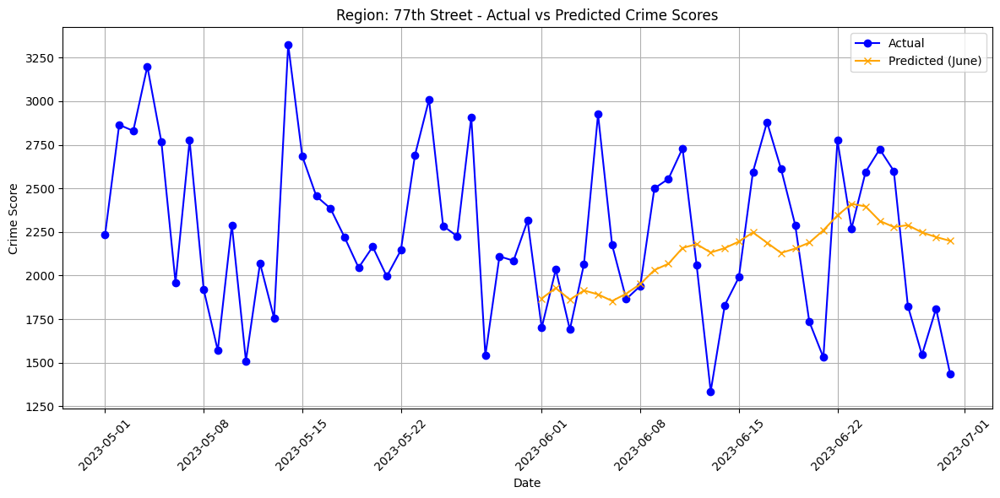

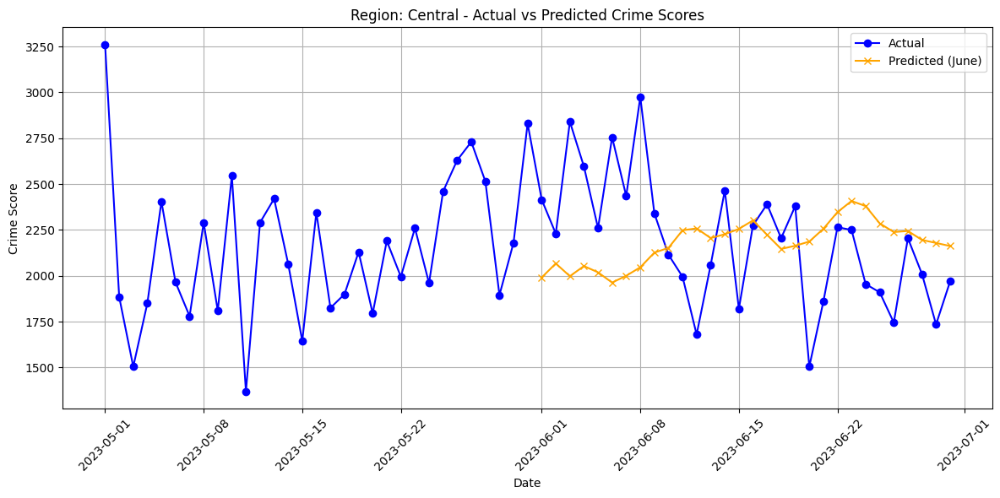

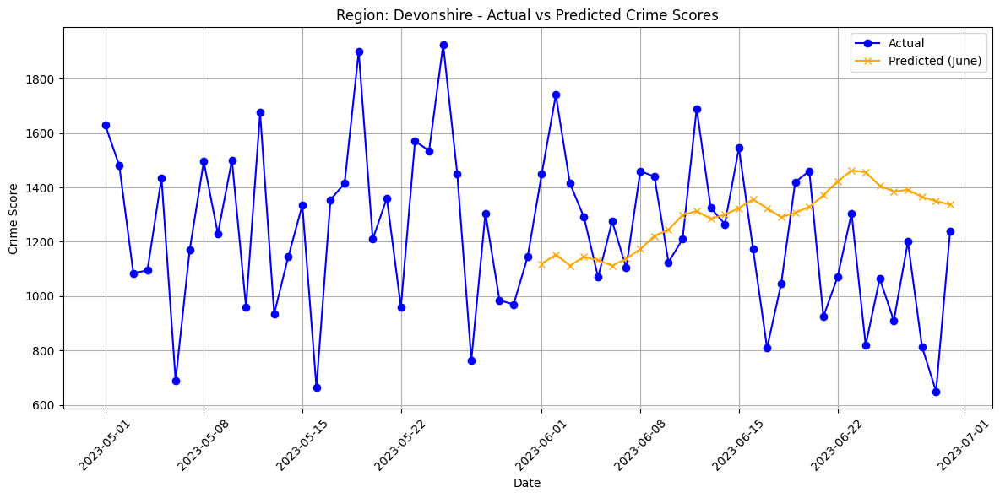

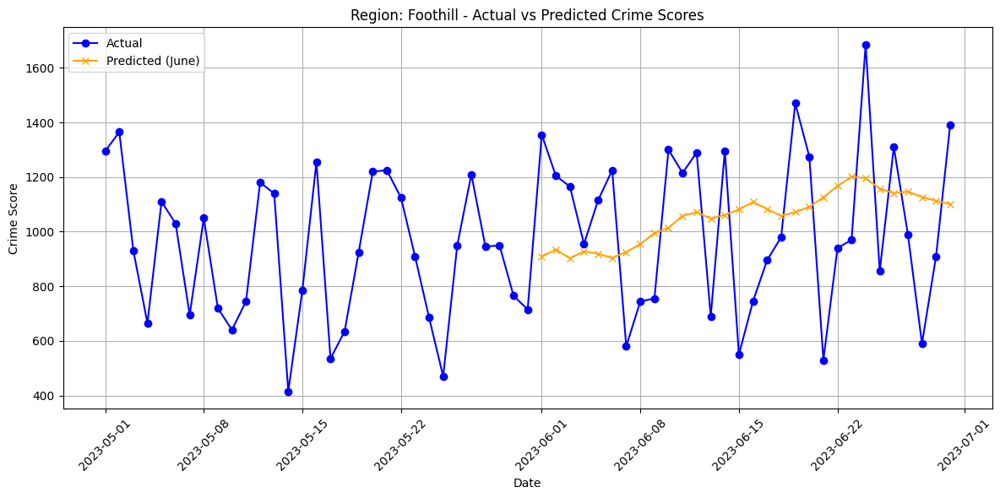

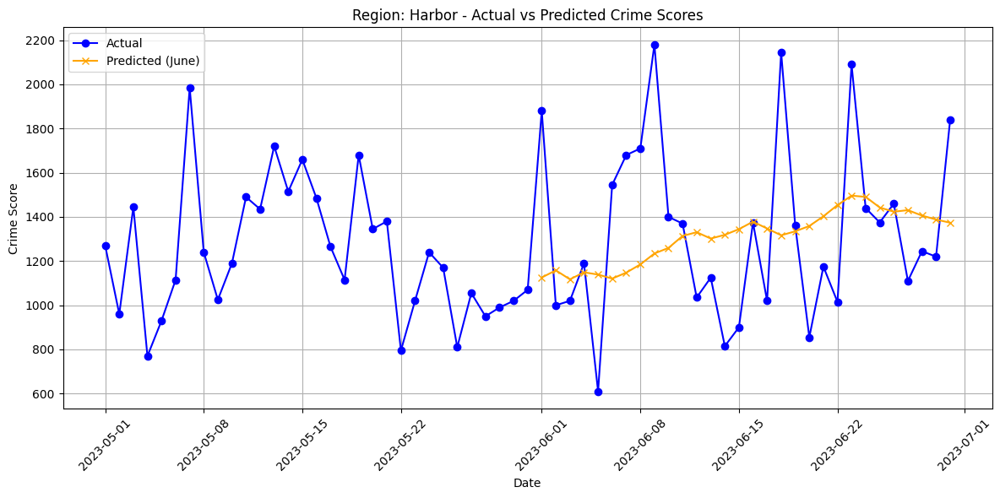

...

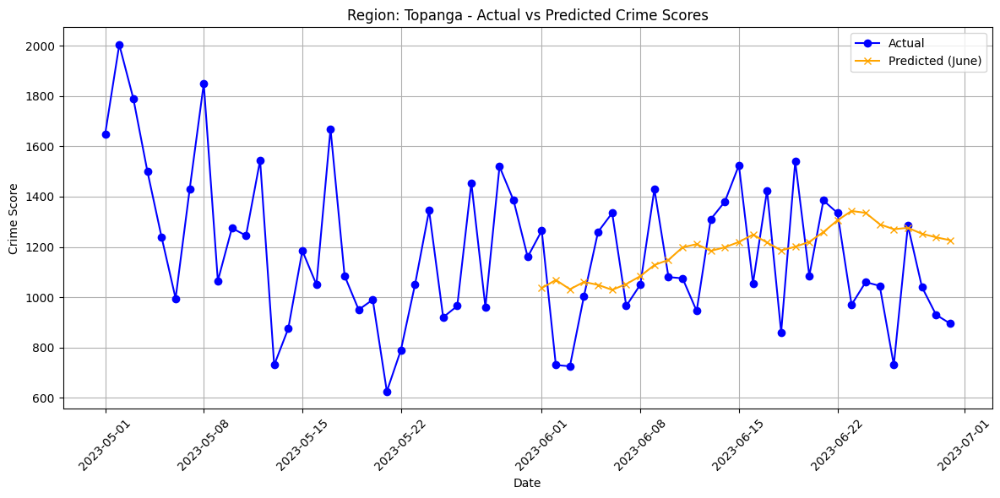

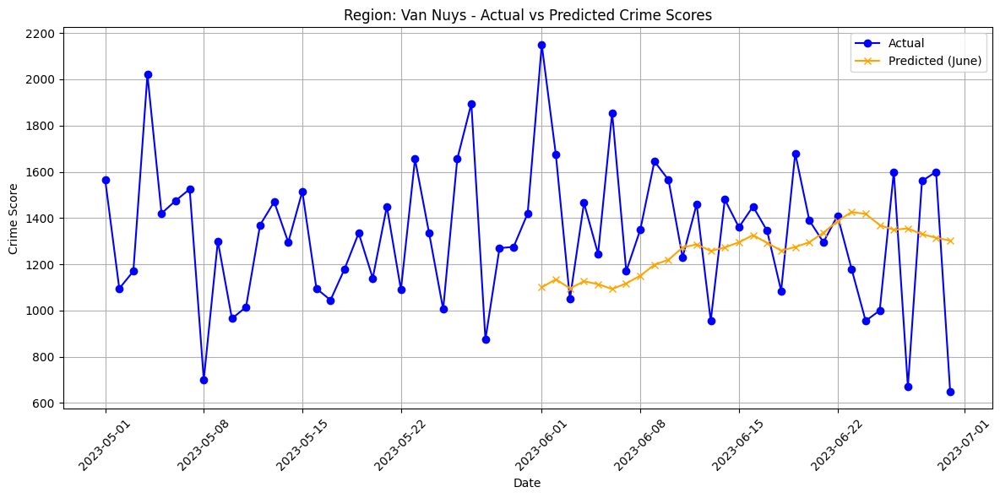

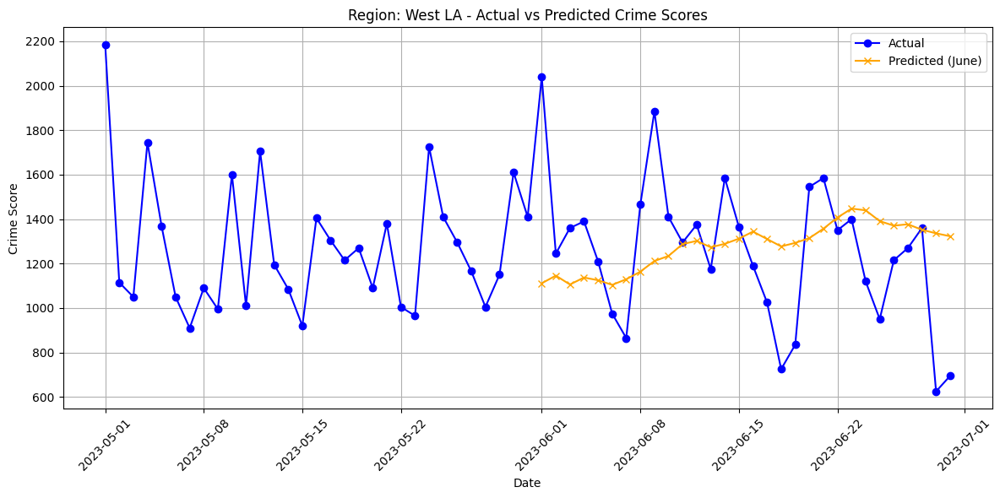

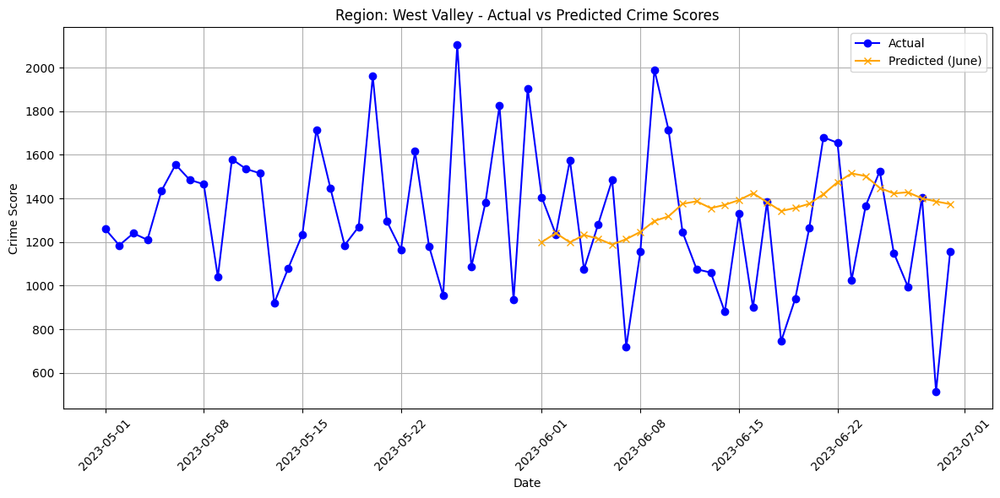

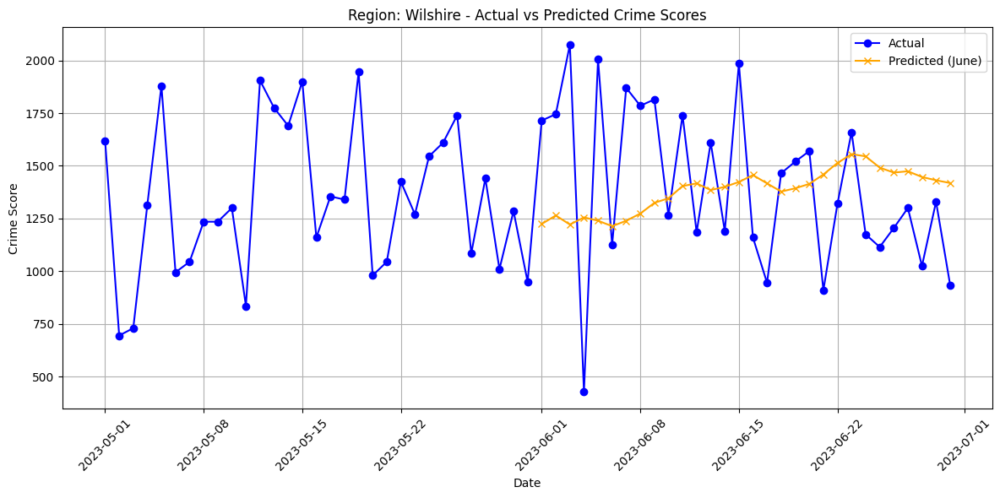

In [19]:
enhanced_model_with_weekday = load_model('enhanced_crime_score_cnn_model_with_weekday.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})

# Filter pivoted_data for May and June 2023
may_data = pivoted_data['2023-05-01':'2023-05-31']
june_data = pivoted_data['2023-06-01':'2023-06-30']

# Initialize a DataFrame to store predictions
# Initialize a DataFrame to store predictions (exclude DayOfWeek column)
june_predictions = pd.DataFrame(index=june_data.index, columns=pivoted_data.columns[:-1])  # Exclude DayOfWeek

# Loop to predict each day in June
input_sequence = may_data.iloc[-30:].values  # Start with the last 30 days of May
for date in june_data.index:
    # Predict scores for the current date
    prediction = enhanced_model_with_weekday.predict(input_sequence[np.newaxis, :, :])[0]
    june_predictions.loc[date] = prediction

    # Update the input sequence by shifting and adding the current prediction
    # Append the predicted values and retain the last column for DayOfWeek
    last_day_of_week = input_sequence[-1, -1]  # Last DayOfWeek feature
    new_row = np.append(prediction, (last_day_of_week + 1) % 7)  # Increment DayOfWeek modulo 7
    input_sequence = np.vstack([input_sequence[1:], new_row])


# Plot results
for region in pivoted_data.columns:
    if region != "DayOfWeek":
      plt.figure(figsize=(12, 6))

      # Plot actual scores for May and June
      plt.plot(pivoted_data['2023-05-01':'2023-06-30'].index,
              pivoted_data['2023-05-01':'2023-06-30'][region],
              label='Actual', color='blue', marker='o')

      # Plot predicted scores for June
      plt.plot(june_predictions.index, june_predictions[region],
              label='Predicted (June)', color='orange', marker='x')

      # Titles and labels
      plt.title(f'Region: {region} - Actual vs Predicted Crime Scores')
      plt.xlabel('Date')
      plt.ylabel('Crime Score')
      plt.xticks(rotation=45)
      plt.legend()
      plt.grid(True)
      plt.tight_layout()
      plt.show()

In [20]:
june_actual_avgs = pivoted_data.loc['2023-06-01':'2023-06-30'].mean(axis=0)
june_actual_avgs = june_actual_avgs.drop('DayOfWeek')
june_actual_avgs

,0
AREA NAME,
77th Street,2153.833333
Central,2188.000000
Devonshire,1210.500000
Foothill,1032.500000
Harbor,1339.500000
Hollenbeck,1150.666667
Hollywood,1450.500000
Mission,1101.666667
N Hollywood,1386.333333


In [21]:
june_predicted_avgs = june_predictions.mean(axis=0)
june_predicted_avgs

,0
AREA NAME,
77th Street,2131.868644
Central,2177.689201
Devonshire,1287.421635
Foothill,1053.06181
Harbor,1309.716748
Hollenbeck,1212.185701
Hollywood,1607.208276
Mission,1247.892448
N Hollywood,1478.971106


In [22]:
# Convert the Series to DataFrames (assuming 'AREA NAME' is the index)
june_actual_avgs_df = june_actual_avgs.reset_index()
june_predicted_avgs_df = june_predicted_avgs.reset_index()

# Merge the two DataFrames on the 'AREA NAME' column
merged_june = june_actual_avgs_df.merge(june_predicted_avgs_df, on='AREA NAME', suffixes=('_actual_avgs', '_predicted_avgs'))

# Add a new column that is the difference between predicted and actual
merged_june['difference'] = merged_june['0_predicted_avgs'] - merged_june['0_actual_avgs']

merged_june = merged_june.sort_values(by='0_predicted_avgs')

merged_june

,AREA NAME,0_actual_avgs,0_predicted_avgs,difference
3,Foothill,1032.500000,1053.06181,20.56181
16,Topanga,1124.000000,1185.648267,61.648267
5,Hollenbeck,1150.666667,1212.185701,61.519035
7,Mission,1101.666667,1247.892448,146.225781
17,Van Nuys,1350.833333,1258.915816,-91.917517
18,West LA,1251.000000,1275.778011,24.778011
2,Devonshire,1210.500000,1287.421635,76.921635
4,Harbor,1339.500000,1309.716748,-29.783252
10,Northeast,1230.833333,1318.335514,87.502181
19,West Valley,1231.000000,1349.221094,118.221094


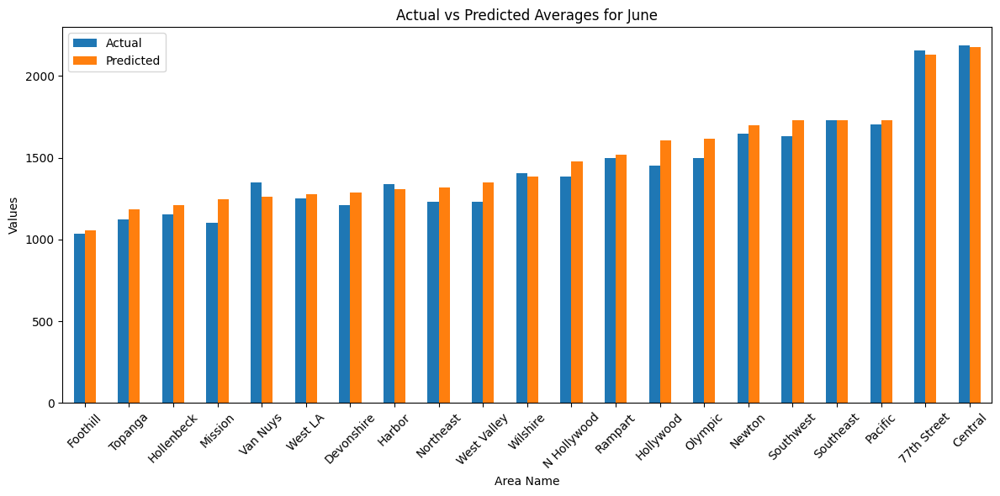

In [23]:
# Assuming merged_june contains the required columns
merged_june.set_index('AREA NAME')[['0_actual_avgs', '0_predicted_avgs']].plot(kind='bar', figsize=(12, 6))
# Set labels and title
plt.title("Actual vs Predicted Averages for June")
plt.xlabel("Area Name")
plt.ylabel("Values")
plt.xticks(rotation=45)
plt.legend(["Actual", "Predicted"])
plt.tight_layout()

# Show the plot
plt.show()

# New approach with min max scaler

In [24]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Assuming pivoted_data is already loaded and includes the DayOfWeek column
# Drop the DayOfWeek column
pivoted_data_scaled = pivoted_data.drop(columns=['DayOfWeek'])

# Apply MinMaxScaler to scale the data between 0 and 1
scaler = MinMaxScaler()
pivoted_data_scaled.iloc[:, :] = scaler.fit_transform(pivoted_data_scaled)

# Generate input-output sequences
def generate_sequences(data, sequence_length=30):
    X, y = [], []
    regions = data.columns
    for i in range(len(data) - sequence_length):
        X.append(data.iloc[i:i + sequence_length].values)  # 30 days
        y.append(data.iloc[i + sequence_length].values)  # 31st day
    return np.array(X), np.array(y), regions

# Generate sequences and split data
X, y, regions = generate_sequences(pivoted_data_scaled)
X_train, X_test, y_train, y_test = split_data(X, y, test_size=0.2)

# Define the model
input_shape = (30, 21)  # 30 days of scores for 21 regions
output_units = 21  # Predicting scores for 21 regions
model = build_enhanced_cnn_model(input_shape=input_shape, output_units=output_units)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=200,  # Adjust based on performance
    batch_size=32
)

# Save the model for future use
model.save('enhanced_crime_score_cnn_model_scaled.h5')

# Evaluate the model
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")


Epoch 1/200


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


32/32 ━━━━━━━━━━━━━━━━━━━━ 5s 40ms/step - loss: 0.0656 - mae: 0.1968 - val_loss: 0.0342 - val_mae: 0.1454
Epoch 2/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 40ms/step - loss: 0.0236 - mae: 0.1191 - val_loss: 0.0154 - val_mae: 0.0970
Epoch 3/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step - loss: 0.0215 - mae: 0.1135 - val_loss: 0.0410 - val_mae: 0.1715
Epoch 4/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - loss: 0.0193 - mae: 0.1070 - val_loss: 0.1059 - val_mae: 0.2926
Epoch 5/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0184 - mae: 0.1046 - val_loss: 0.2527 - val_mae: 0.4655
Epoch 6/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 32ms/step - loss: 0.0179 - mae: 0.1018 - val_loss: 0.1824 - val_mae: 0.3925
Epoch 7/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0176 - mae: 0.1010 - val_loss: 0.1716 - val_mae: 0.3744
Epoch 8/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0166 - mae: 0.0980 - val_loss: 0.2135 - val_mae: 0.4261
Epoch 9/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 0.0152 -

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - loss: 0.0133 - mae: 0.0876
Test Loss: 0.013145437464118004, Test MAE: 0.08744625002145767


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━

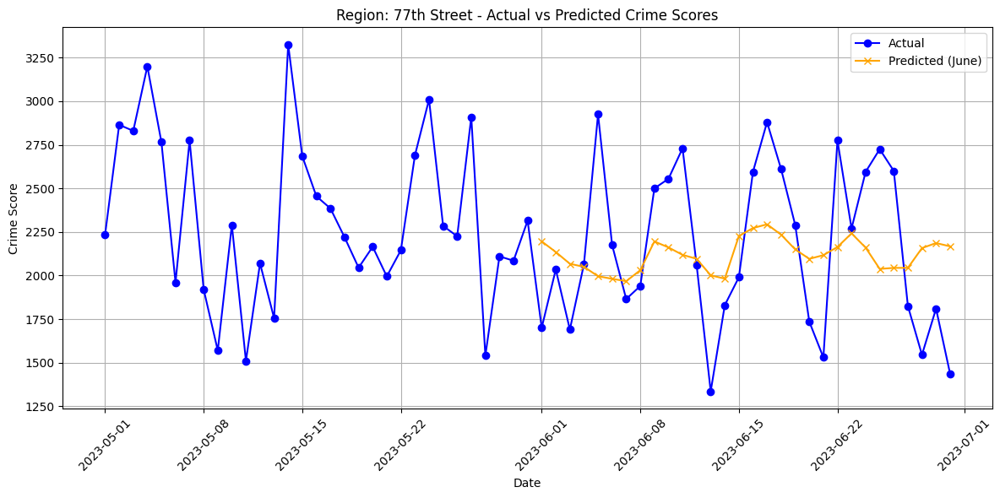

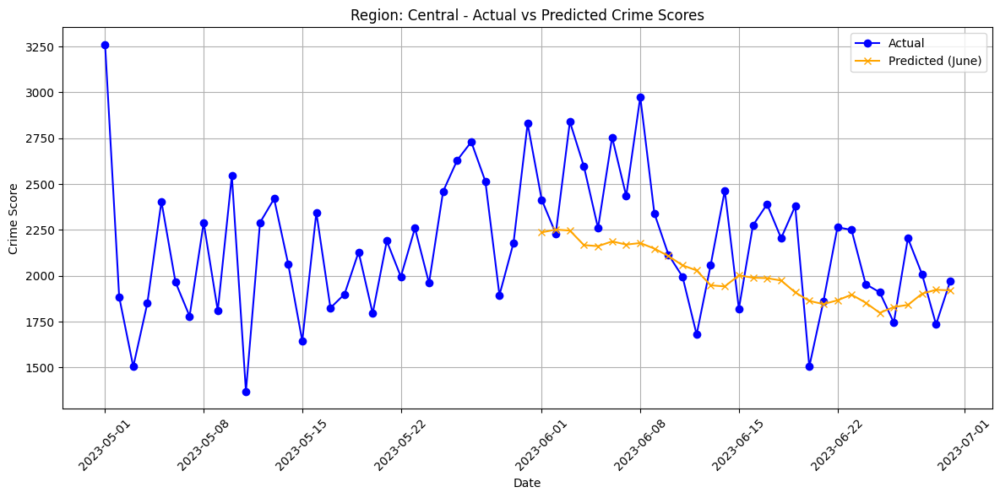

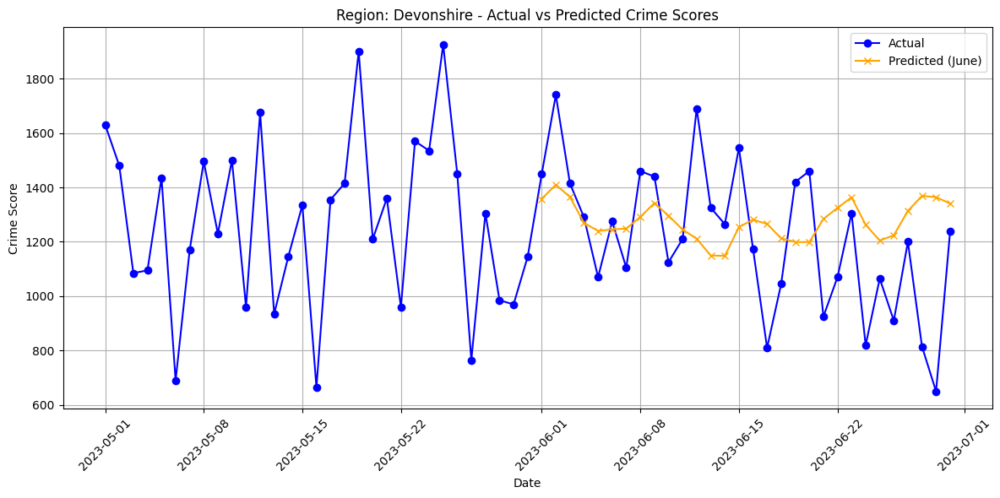

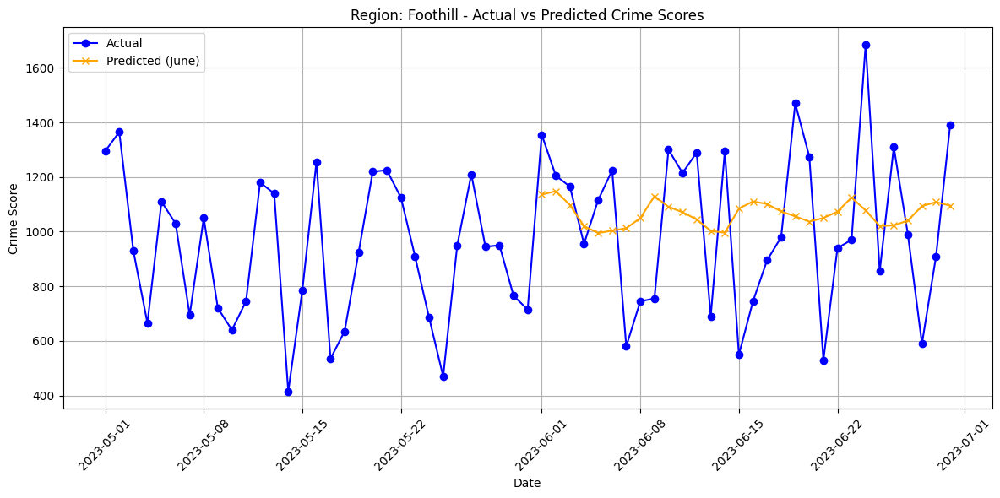

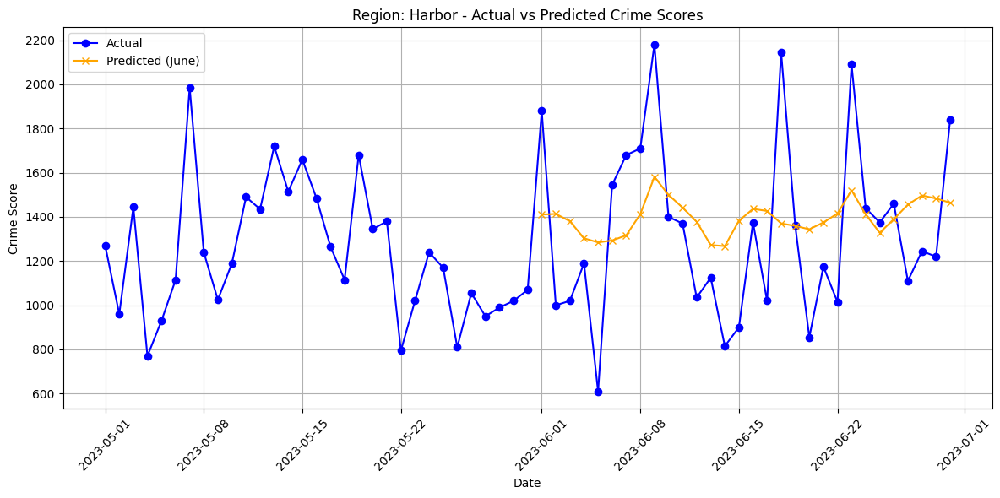

...

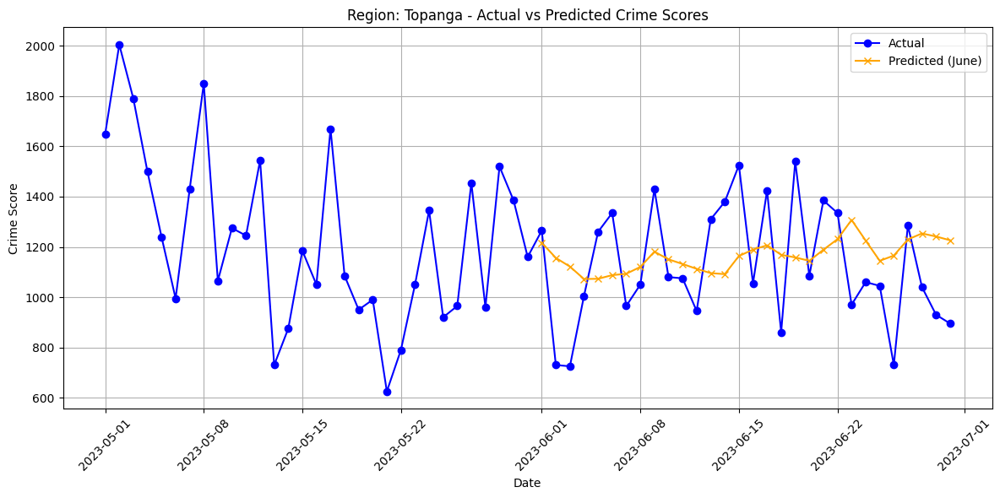

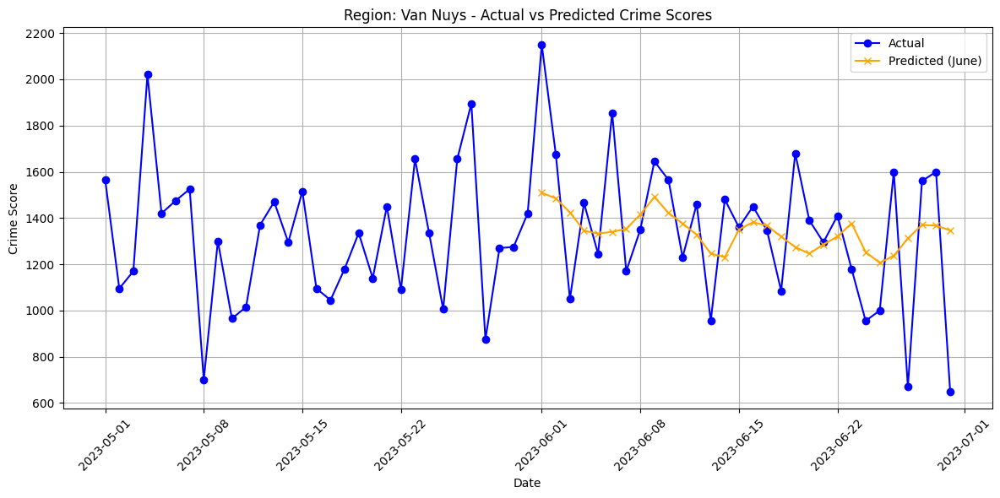

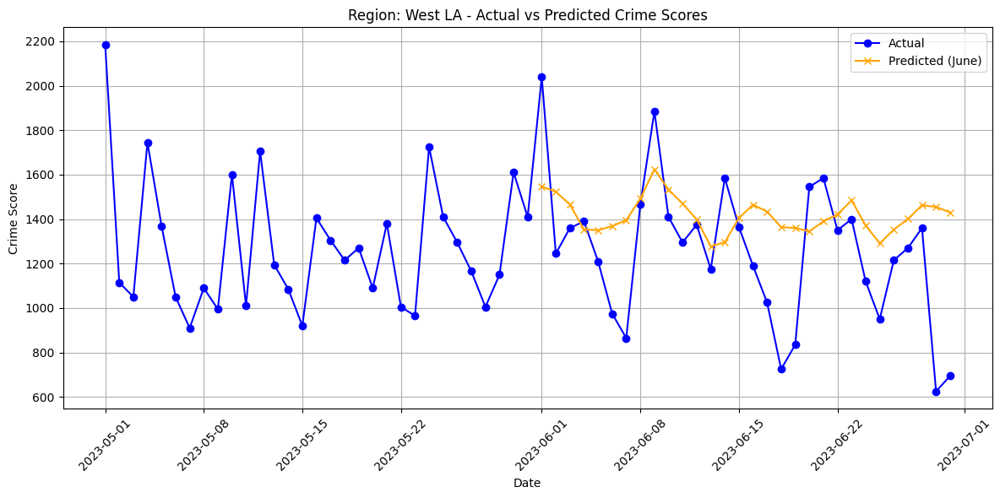

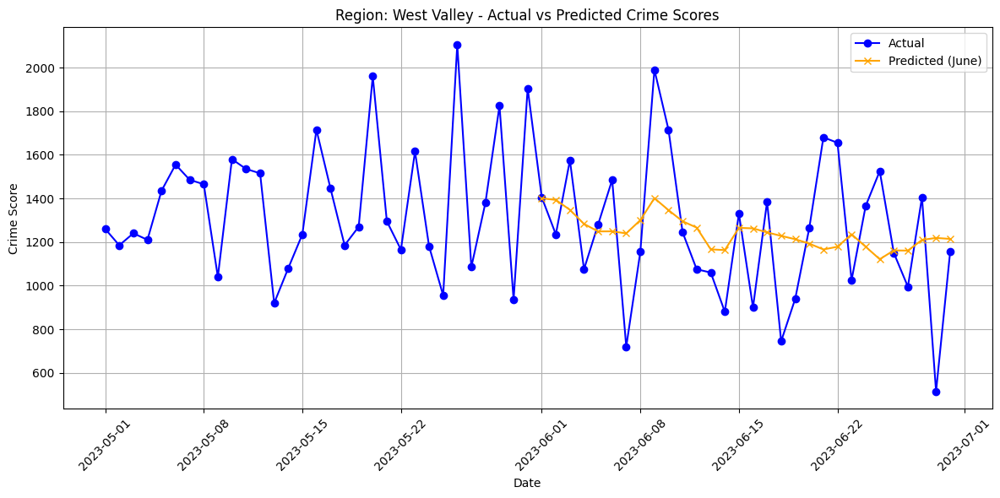

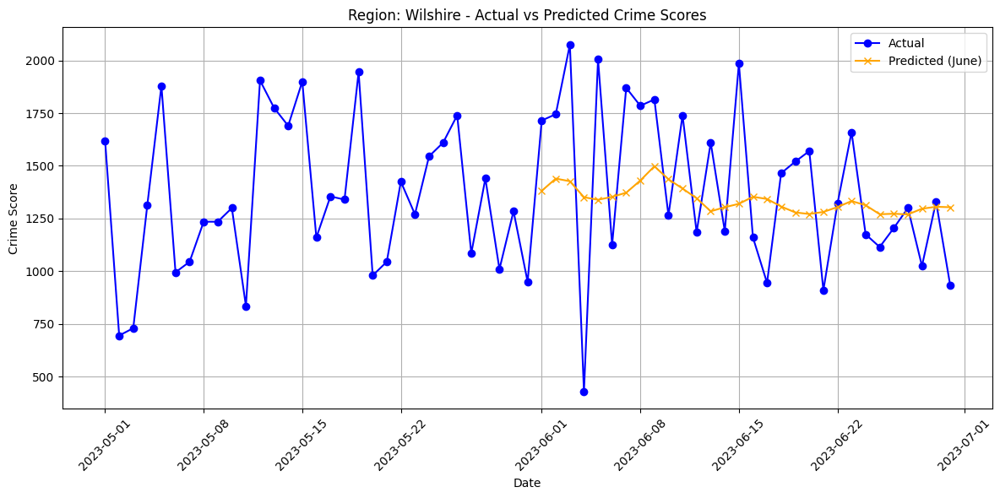

In [29]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from tensorflow.keras.models import load_model

# Load the model
enhanced_model_scaled = load_model('enhanced_crime_score_cnn_model_scaled.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})
# load_model('crime_score_cnn_model.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})

# Filter pivoted_data for May and June 2023
may_data = pivoted_data_scaled['2023-05-01':'2023-05-31']
june_data = pivoted_data_scaled['2023-06-01':'2023-06-30']

# Initialize a DataFrame to store predictions
june_predictions_scaled = pd.DataFrame(index=june_data.index, columns=pivoted_data_scaled.columns)

# Loop to predict each day in June
input_sequence = may_data.iloc[-30:].values  # Start with the last 30 days of May
for date in june_data.index:
    # Predict scores for the current date
    prediction_scaled = enhanced_model_scaled.predict(input_sequence[np.newaxis, :, :])[0]
    june_predictions_scaled.loc[date] = prediction_scaled

    # Update the input sequence by shifting and adding the current prediction
    input_sequence = np.vstack([input_sequence[1:], prediction_scaled])

# Transform predictions back to original scale
june_predictions = pd.DataFrame(
    scaler.inverse_transform(june_predictions_scaled),
    index=june_predictions_scaled.index,
    columns=june_predictions_scaled.columns
)

# Plot results
for region in pivoted_data_scaled.columns:
    plt.figure(figsize=(12, 6))

    # Plot actual scores for May and June
    plt.plot(pivoted_data['2023-05-01':'2023-06-30'].index,
             pivoted_data['2023-05-01':'2023-06-30'][region],
             label='Actual', color='blue', marker='o')

    # Plot predicted scores for June
    plt.plot(june_predictions.index, june_predictions[region],
             label='Predicted (June)', color='orange', marker='x')

    # Titles and labels
    plt.title(f'Region: {region} - Actual vs Predicted Crime Scores')
    plt.xlabel('Date')
    plt.ylabel('Crime Score')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [33]:
june_predictions.iloc[:,:1]

AREA NAME,77th Street
DATE OCC,
2023-06-01,2195.807664
2023-06-02,2134.853159
2023-06-03,2067.385335
2023-06-04,2049.850153
2023-06-05,1996.059296
2023-06-06,1981.110040
2023-06-07,1967.491547
2023-06-08,2030.582769
2023-06-09,2195.606945


In [36]:
pivoted_data.loc['2023-06-01':'2023-06-30','77th Street']

,77th Street
DATE OCC,
2023-06-01,1700.0
2023-06-02,2035.0
2023-06-03,1690.0
2023-06-04,2065.0
2023-06-05,2925.0
2023-06-06,2175.0
2023-06-07,1865.0
2023-06-08,1940.0
2023-06-09,2500.0


In [38]:
june_predictions_77th = june_predictions.iloc[:,:1]
actual_june_77th = pivoted_data.loc['2023-06-01':'2023-06-30','77th Street']

merged_june_77th = pd.merge(
    june_predictions_77th,
    actual_june_77th,
    left_index=True,
    right_index=True,
    how='inner'
)

# Rename columns for clarity
merged_june_77th.columns = ['Predicted_77th', 'Actual_77th']

# Add a third column for the difference between Actual and Predicted
merged_june_77th['Difference'] = merged_june_77th['Actual_77th'] - merged_june_77th['Predicted_77th']

# Display the updated DataFrame
merged_june_77th


,Predicted_77th,Actual_77th,Difference
DATE OCC,,,
2023-06-01,2195.807664,1700.0,-495.807664
2023-06-02,2134.853159,2035.0,-99.853159
2023-06-03,2067.385335,1690.0,-377.385335
2023-06-04,2049.850153,2065.0,15.149847
2023-06-05,1996.059296,2925.0,928.940704
2023-06-06,1981.110040,2175.0,193.889960
2023-06-07,1967.491547,1865.0,-102.491547
2023-06-08,2030.582769,1940.0,-90.582769
2023-06-09,2195.606945,2500.0,304.393055


In [40]:
# Evaluate the model to get normalized losses
test_loss, test_mae = model.evaluate(X_test, y_test, verbose=0)
train_loss, train_mae = model.evaluate(X_train, y_train, verbose=0)

# Reshape the loss into the same shape as the data for inverse transform
test_loss_reshaped = np.array([[test_loss] * y_test.shape[1]])
train_loss_reshaped = np.array([[train_loss] * y_train.shape[1]])

# Use the scaler to inverse transform the losses
rescaled_test_loss = scaler.inverse_transform(test_loss_reshaped)[0].mean()
rescaled_train_loss = scaler.inverse_transform(train_loss_reshaped)[0].mean()

# Print rescaled losses
print(f"Rescaled Test Loss: {rescaled_test_loss}")
print(f"Rescaled Train Loss: {rescaled_train_loss}")


Rescaled Test Loss: 435.92690042574844
Rescaled Train Loss: 419.53354409430176


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━

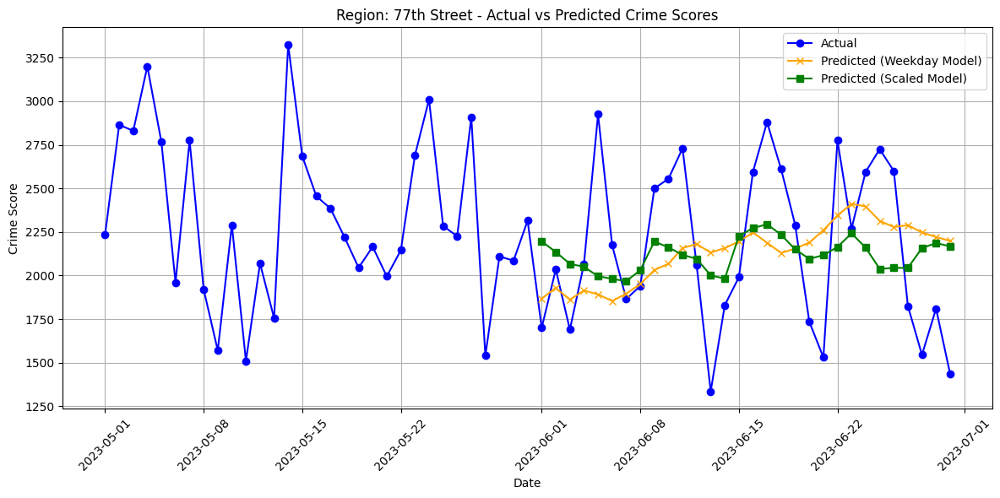

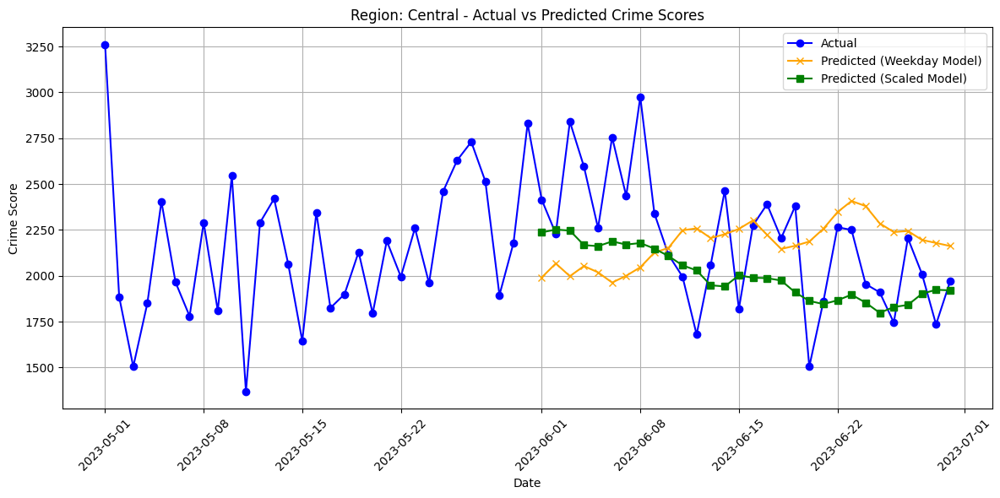

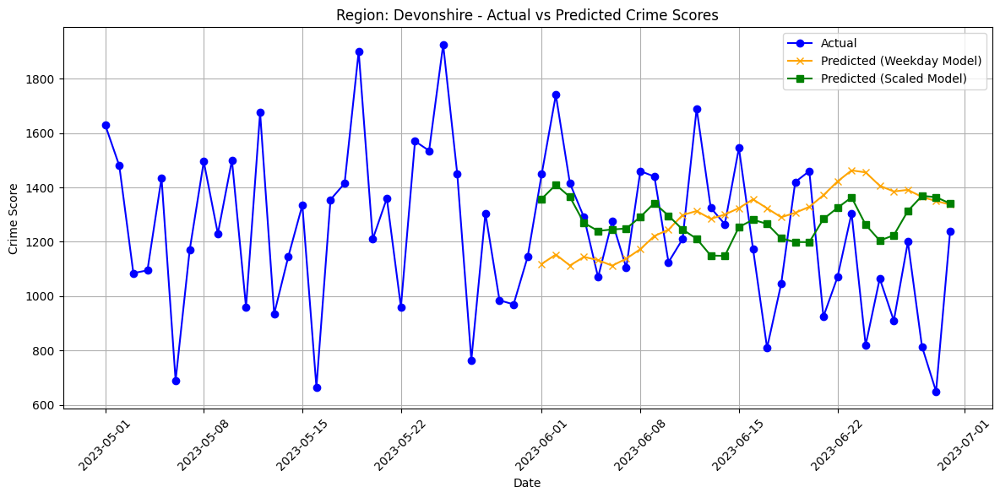

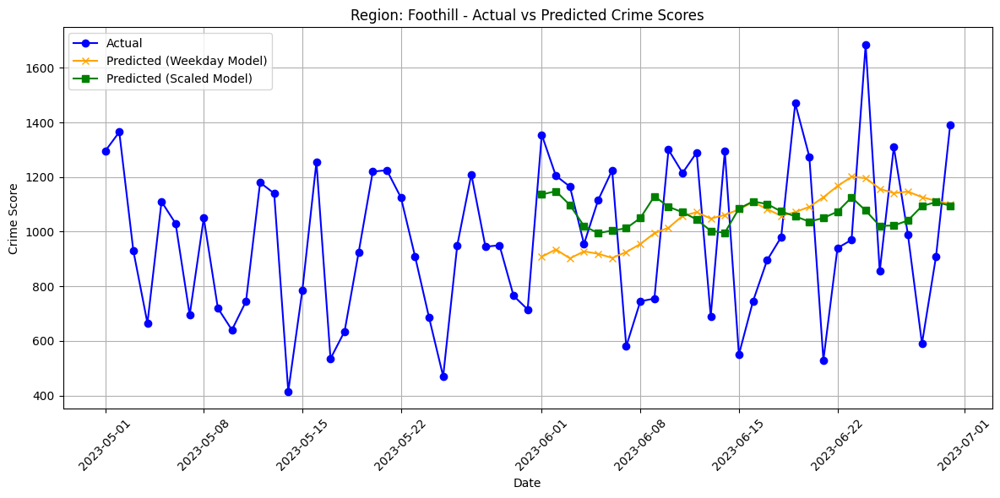

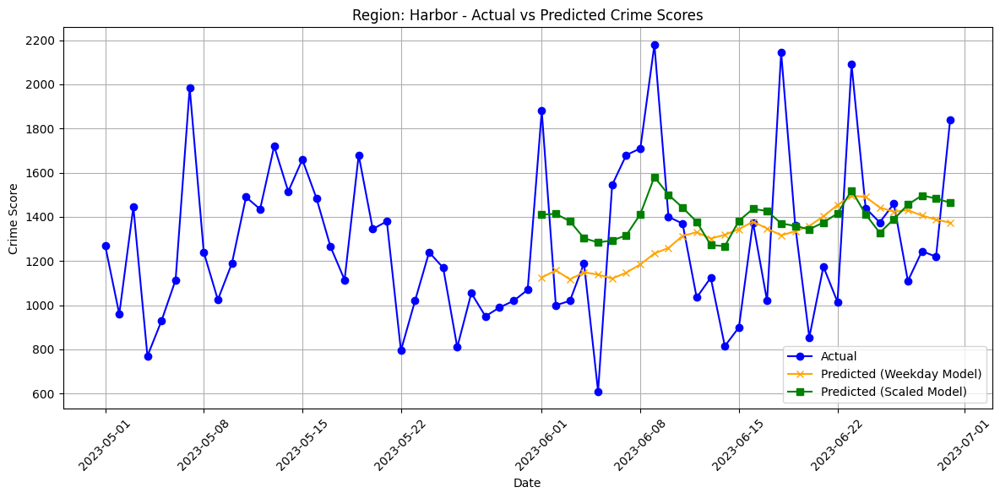

...

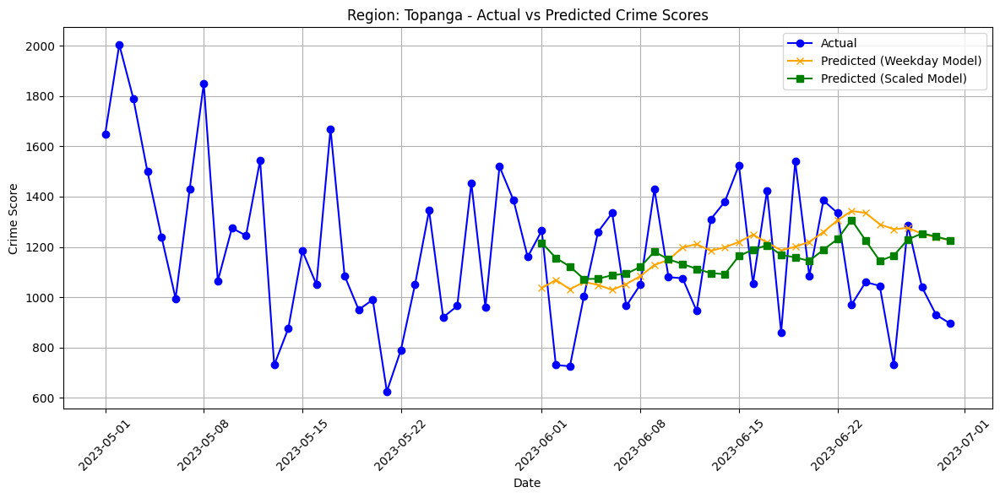

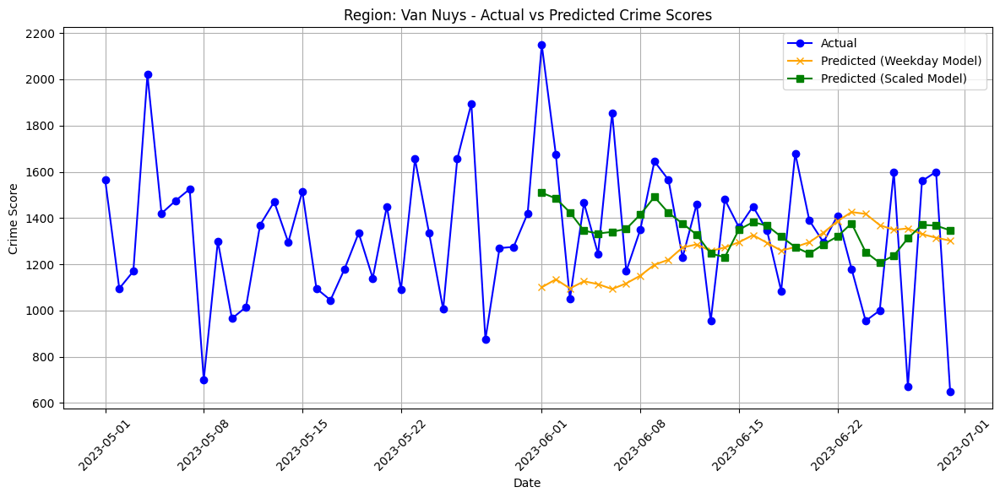

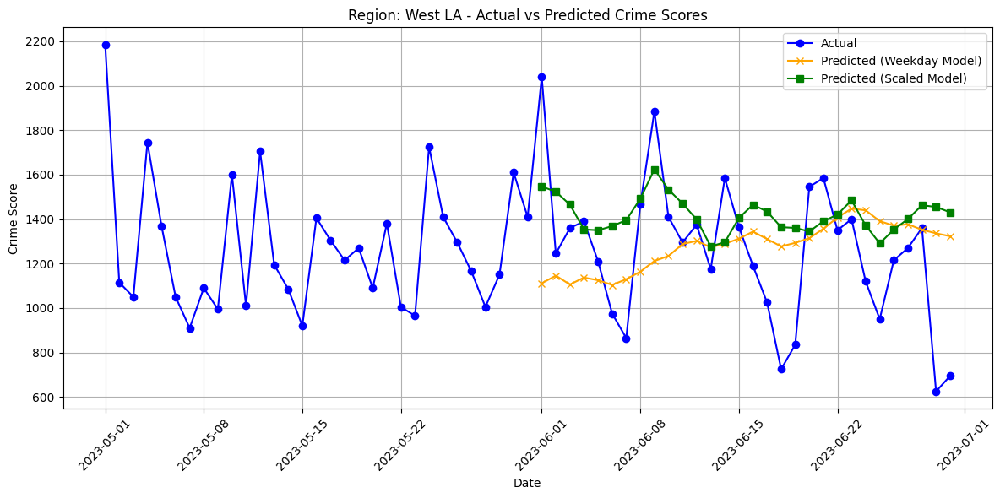

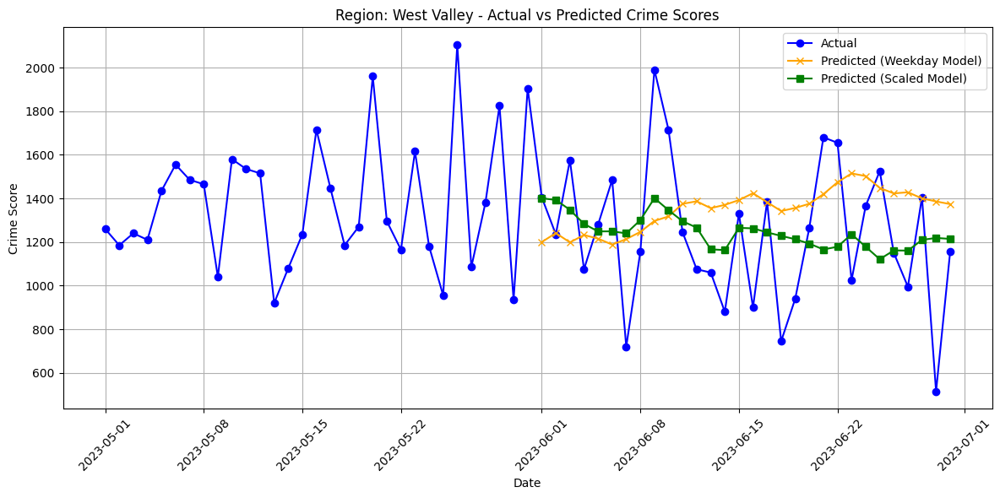

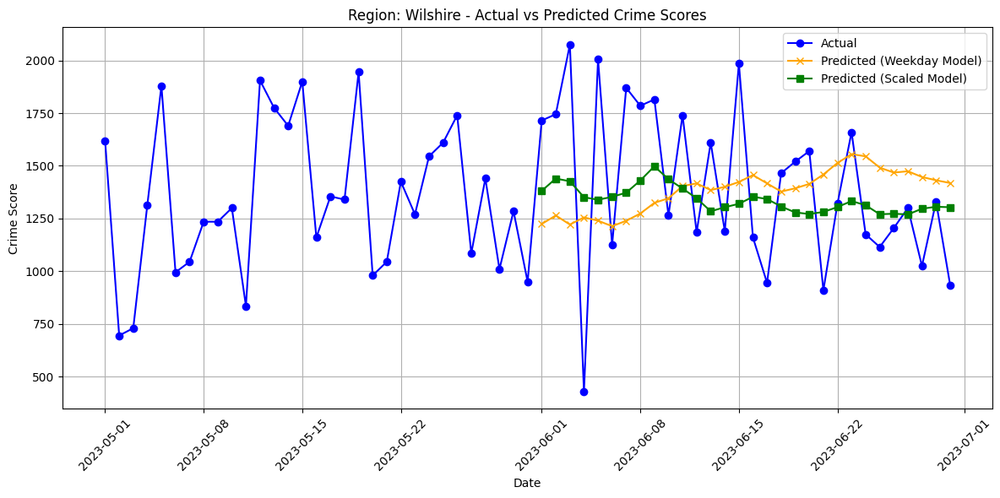

In [41]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from tensorflow.keras.models import load_model
import tensorflow as tf

# Load models
enhanced_model_with_weekday = load_model('enhanced_crime_score_cnn_model_with_weekday.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})
enhanced_model_scaled = load_model('enhanced_crime_score_cnn_model_scaled.h5', custom_objects={'mse': tf.keras.losses.MeanSquaredError()})

# Filter pivoted_data for May and June 2023
may_data_weekday = pivoted_data['2023-05-01':'2023-05-31']
june_data_weekday = pivoted_data['2023-06-01':'2023-06-30']

may_data_scaled = pivoted_data_scaled['2023-05-01':'2023-05-31']
june_data_scaled = pivoted_data_scaled['2023-06-01':'2023-06-30']

# Initialize DataFrames to store predictions
june_predictions_weekday = pd.DataFrame(index=june_data_weekday.index, columns=pivoted_data.columns[:-1])  # Exclude DayOfWeek
june_predictions_scaled = pd.DataFrame(index=june_data_scaled.index, columns=pivoted_data_scaled.columns)

# Predict for the weekday model
input_sequence = may_data_weekday.iloc[-30:].values  # Start with the last 30 days of May
for date in june_data_weekday.index:
    prediction = enhanced_model_with_weekday.predict(input_sequence[np.newaxis, :, :])[0]
    june_predictions_weekday.loc[date] = prediction
    # Update the input sequence
    last_day_of_week = input_sequence[-1, -1]  # Last DayOfWeek feature
    new_row = np.append(prediction, (last_day_of_week + 1) % 7)  # Increment DayOfWeek modulo 7
    input_sequence = np.vstack([input_sequence[1:], new_row])

# Predict for the scaled model
input_sequence = may_data_scaled.iloc[-30:].values  # Start with the last 30 days of May
for date in june_data_scaled.index:
    prediction_scaled = enhanced_model_scaled.predict(input_sequence[np.newaxis, :, :])[0]
    june_predictions_scaled.loc[date] = prediction_scaled
    # Update the input sequence
    input_sequence = np.vstack([input_sequence[1:], prediction_scaled])

# Transform scaled predictions back to the original scale
june_predictions_scaled = pd.DataFrame(
    scaler.inverse_transform(june_predictions_scaled),
    index=june_predictions_scaled.index,
    columns=june_predictions_scaled.columns
)

# Plot results
for region in pivoted_data.columns[:-1]:  # Exclude DayOfWeek
    plt.figure(figsize=(12, 6))

    # Plot actual scores for May and June
    plt.plot(pivoted_data['2023-05-01':'2023-06-30'].index,
             pivoted_data['2023-05-01':'2023-06-30'][region],
             label='Actual', color='blue', marker='o')

    # Plot predictions from the weekday model
    plt.plot(june_predictions_weekday.index, june_predictions_weekday[region],
             label='Predicted (Weekday Model)', color='orange', marker='x')

    # Plot predictions from the scaled model
    plt.plot(june_predictions_scaled.index, june_predictions_scaled[region],
             label='Predicted (Scaled Model)', color='green', marker='s')

    # Titles and labels
    plt.title(f'Region: {region} - Actual vs Predicted Crime Scores')
    plt.xlabel('Date')
    plt.ylabel('Crime Score')
    plt.xticks(rotation=45)
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()



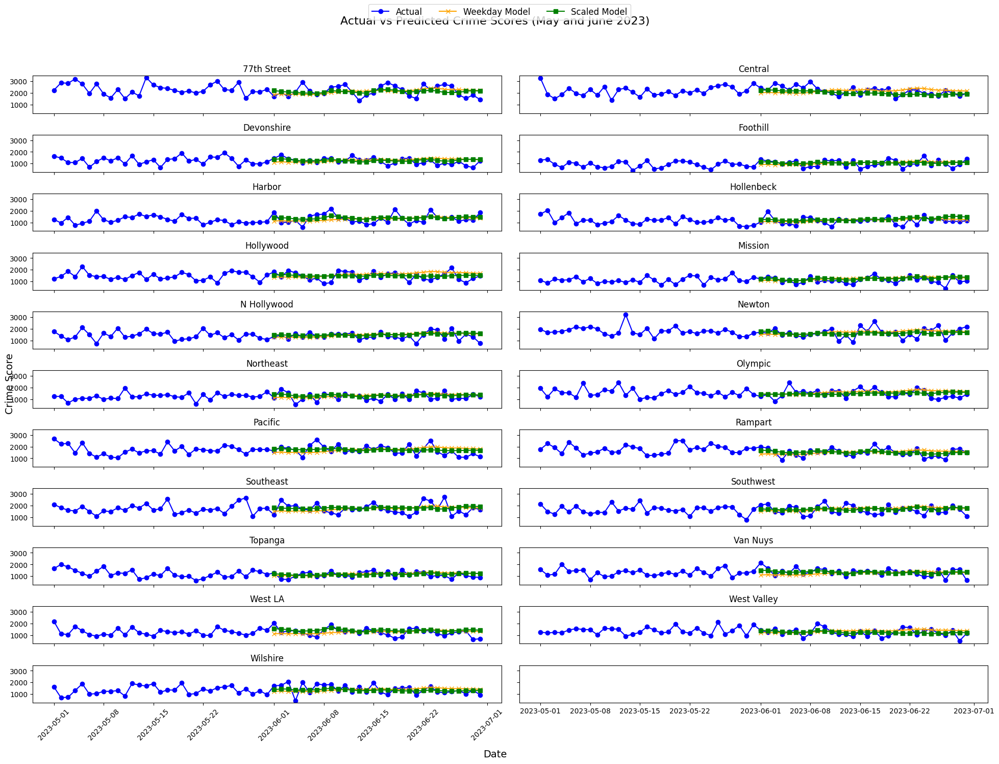

In [45]:
# Set up a 3x7 grid layout for the plots
fig, axes = plt.subplots(11, 2, figsize=(20, 15), sharex=True, sharey=True)
axes = axes.flatten()

# Plot results for each region
for idx, region in enumerate(pivoted_data.columns[:-1]):  # Exclude DayOfWeek
    ax = axes[idx]

    # Plot actual scores for May and June
    ax.plot(pivoted_data['2023-05-01':'2023-06-30'].index,
            pivoted_data['2023-05-01':'2023-06-30'][region],
            label='Actual', color='blue', marker='o')

    # Plot predictions from the weekday model
    ax.plot(june_predictions_weekday.index, june_predictions_weekday[region],
            label='Weekday Model', color='orange', marker='x')

    # Plot predictions from the scaled model
    ax.plot(june_predictions_scaled.index, june_predictions_scaled[region],
            label='Scaled Model', color='green', marker='s')

    # Titles and labels
    ax.set_title(region)
    ax.tick_params(axis='x', rotation=45)

# Add a legend and global labels
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=3, fontsize=12)
fig.suptitle('Actual vs Predicted Crime Scores (May and June 2023)', fontsize=16)
fig.supxlabel('Date', fontsize=14)
fig.supylabel('Crime Score', fontsize=14)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to fit title and legend
plt.show()

In [48]:
# Calculate averages for actual, weekday model predictions, and scaled model predictions
june_actual_avgs = pivoted_data.loc['2023-06-01':'2023-06-30'].mean()
june_weekday_predicted_avgs = june_predictions_weekday.mean()
june_scaled_predicted_avgs = june_predictions_scaled.mean()

# Convert to DataFrames and reset index
june_actual_avgs_df = june_actual_avgs.reset_index()
june_weekday_predicted_avgs_df = june_weekday_predicted_avgs.reset_index()
june_scaled_predicted_avgs_df = june_scaled_predicted_avgs.reset_index()

# Rename columns for clarity
june_actual_avgs_df.columns = ['AREA NAME', 'actual_avg']
june_weekday_predicted_avgs_df.columns = ['AREA NAME', 'weekday_predicted_avg']
june_scaled_predicted_avgs_df.columns = ['AREA NAME', 'scaled_predicted_avg']

# Merge all three DataFrames on 'AREA NAME'
merged_june = june_actual_avgs_df.merge(
    june_weekday_predicted_avgs_df, on='AREA NAME'
).merge(
    june_scaled_predicted_avgs_df, on='AREA NAME'
)

# Add columns for differences
merged_june['weekday_difference'] = merged_june['weekday_predicted_avg'] - merged_june['actual_avg']
merged_june['scaled_difference'] = merged_june['scaled_predicted_avg'] - merged_june['actual_avg']

# Sort by scaled_predicted_avg for better readability
merged_june = merged_june.sort_values(by='actual_avg')

# Display the merged DataFrame
merged_june

,AREA NAME,actual_avg,weekday_predicted_avg,scaled_predicted_avg,weekday_difference,scaled_difference
3,Foothill,1032.500000,1053.06181,1065.724050,20.56181,33.224050
7,Mission,1101.666667,1247.892448,1245.947330,146.225781,144.280664
16,Topanga,1124.000000,1185.648267,1164.996969,61.648267,40.996969
5,Hollenbeck,1150.666667,1212.185701,1292.586580,61.519035,141.919914
2,Devonshire,1210.500000,1287.421635,1276.157996,76.921635,65.657996
10,Northeast,1230.833333,1318.335514,1339.598069,87.502181,108.764736
19,West Valley,1231.000000,1349.221094,1244.942415,118.221094,13.942415
18,West LA,1251.000000,1275.778011,1417.551489,24.778011,166.551489
4,Harbor,1339.500000,1309.716748,1397.285700,-29.783252,57.785700
17,Van Nuys,1350.833333,1258.915816,1343.785744,-91.917517,-7.047589


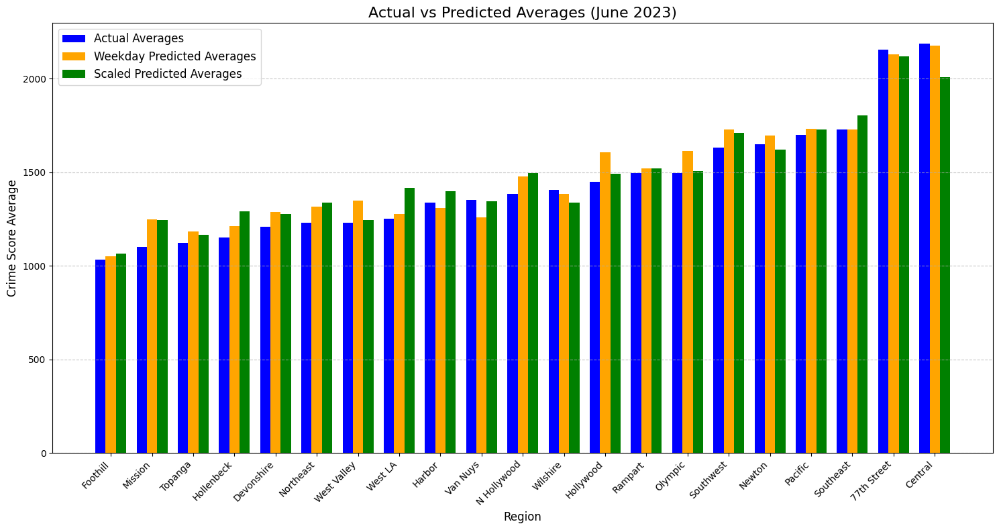

In [49]:
# Plot the bar chart
x = np.arange(len(merged_june['AREA NAME']))  # Indices for the regions
width = 0.25  # Bar width

fig, ax = plt.subplots(figsize=(15, 8))

# Plot bars for actual, weekday predictions, and scaled predictions
ax.bar(x - width, merged_june['actual_avg'], width, label='Actual Averages', color='blue')
ax.bar(x, merged_june['weekday_predicted_avg'], width, label='Weekday Predicted Averages', color='orange')
ax.bar(x + width, merged_june['scaled_predicted_avg'], width, label='Scaled Predicted Averages', color='green')

# Add labels and title
ax.set_xlabel('Region', fontsize=12)
ax.set_ylabel('Crime Score Average', fontsize=12)
ax.set_title('Actual vs Predicted Averages (June 2023)', fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(merged_june['AREA NAME'], rotation=45, ha='right')
ax.legend(fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [52]:
merged_june.iloc[:,1:].mean(axis=0)

,0
actual_avg,1443.388889
weekday_predicted_avg,1490.361368
scaled_predicted_avg,1482.462137
weekday_difference,46.972479
scaled_difference,39.073248


In [54]:
merged_june['diff_in_diff'] = merged_june['weekday_difference'] - merged_june['scaled_difference']
merged_june.sort_values('diff_in_diff')

,AREA NAME,actual_avg,weekday_predicted_avg,scaled_predicted_avg,weekday_difference,scaled_difference,diff_in_diff
18,West LA,1251.000000,1275.778011,1417.551489,24.778011,166.551489,-141.773478
4,Harbor,1339.500000,1309.716748,1397.285700,-29.783252,57.785700,-87.568952
17,Van Nuys,1350.833333,1258.915816,1343.785744,-91.917517,-7.047589,-84.869928
5,Hollenbeck,1150.666667,1212.185701,1292.586580,61.519035,141.919914,-80.400879
14,Southeast,1730.333333,1728.869462,1802.689554,-1.463871,72.356221,-73.820092
10,Northeast,1230.833333,1318.335514,1339.598069,87.502181,108.764736,-21.262555
8,N Hollywood,1386.333333,1478.971106,1494.917609,92.637773,108.584275,-15.946503
3,Foothill,1032.500000,1053.06181,1065.724050,20.56181,33.224050,-12.66224
13,Rampart,1495.833333,1519.968156,1519.788490,24.134823,23.955156,0.179666
7,Mission,1101.666667,1247.892448,1245.947330,146.225781,144.280664,1.945118


In [56]:
from sklearn.preprocessing import MinMaxScaler
import numpy as np

# Assuming pivoted_data is already loaded and includes the DayOfWeek column
# Drop the DayOfWeek column
pivoted_data_scaled = pivoted_data.drop(columns=['DayOfWeek'])

# Apply MinMaxScaler to scale the data between 0 and 1
scaler = MinMaxScaler()
pivoted_data_scaled.iloc[:, :] = scaler.fit_transform(pivoted_data_scaled)

# Generate input-output sequences
def generate_sequences(data, sequence_length=7):
    X, y = [], []
    regions = data.columns
    for i in range(len(data) - sequence_length):
        X.append(data.iloc[i:i + sequence_length].values)  # 7 days
        y.append(data.iloc[i + sequence_length].values)  # 8th day
    return np.array(X), np.array(y), regions

# Generate sequences and split data
X, y, regions = generate_sequences(pivoted_data_scaled)
X_train, X_test, y_train, y_test = split_data(X, y, test_size=0.2)

# Define the model
input_shape = (7, 21)  # 7 days of scores for 21 regions
output_units = 21  # Predicting scores for 21 regions
model = build_enhanced_cnn_model(input_shape=input_shape, output_units=output_units)

# Train the model
history = model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=200,  # Adjust based on performance
    batch_size=32
)

# Save the model for future use
model.save('enhanced_crime_score_cnn_model_scaled_7_day_sequence.h5')

# Evaluate the model
test_loss, test_mae = model.evaluate(X_test, y_test)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.2005 - mae: 0.3352 - val_loss: 0.1035 - val_mae: 0.2851
Epoch 2/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0477 - mae: 0.1709 - val_loss: 0.0545 - val_mae: 0.1942
Epoch 3/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0357 - mae: 0.1477 - val_loss: 0.0374 - val_mae: 0.1533
Epoch 4/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0291 - mae: 0.1323 - val_loss: 0.0304 - val_mae: 0.1349
Epoch 5/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0258 - mae: 0.1238 - val_loss: 0.0235 - val_mae: 0.1153
Epoch 6/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.0232 - mae: 0.1166 - val_loss: 0.0179 - val_mae: 0.0986
Epoch 7/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - loss: 0.0232 - mae: 0.1165 - val_loss: 0.0187 - val_mae: 0.1010
Epoch 8/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 15ms/step - loss: 0.0210 - mae: 0.1100 - val_loss: 0.0168 - val_mae: 0.0955
Epoch 9/200
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step - lo

8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 0.0135 - mae: 0.0870 
Test Loss: 0.013753488659858704, Test MAE: 0.08773984760046005
